# Natural Language Processing

**Overview**: In this we worked with the Amazon Reviews Dataset. This dataset contains hundreds of thousands of reviews, each with it's raw text, it's summary and a score from 1-5 on the rating corresponding to the review. 

We created a multitude of discriminative models to classify the rating from the text of the review, from simple non-deep learning baseline approaches to creating multiple different deep recurrent neural networks, using attention and transfer learning to boost classfication accuracy. Past that, we created a generative model to generate summaries of a given review from scratch!





# Setting up 


## Connect to Google Drive



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Utility Functions

The function below is a utility function for plotting Confusion Matrices. 


In [ ]:
from textwrap import wrap
import re
import itertools
import matplotlib
import numpy as np
from sklearn.metrics import confusion_matrix


# Credits - https://stackoverflow.com/questions/41617463/tensorflow-confusion-matrix-in-tensorboard
def plot_confusion_matrix(correct_labels, predict_labels, labels, display_labels, title='Confusion matrix', tensor_name = 'MyFigure/image', normalize=False):
  ''' 
  Parameters:
      correct_labels                  : These are your true classification categories.
      predict_labels                  : These are you predicted classification categories
      labels                          : This is a lit of labels which will be used to display the axix labels
      title='Confusion matrix'        : Title for your matrix
      tensor_name = 'MyFigure/image'  : Name for the output summay tensor

  Returns:
      summary: TensorFlow summary 

  Other itema to note:
      - Depending on the number of category and the data , you may have to modify the figzie, font sizes etc. 
      - Currently, some of the ticks dont line up due to rotations.
  '''
  cm = confusion_matrix(correct_labels, predict_labels, labels=labels)
  if normalize:
      cm = cm.astype('float')*10 / cm.sum(axis=1)[:, np.newaxis]
      cm = np.nan_to_num(cm, copy=True)
      cm = cm.astype('int')

  np.set_printoptions(precision=2)
  ###fig, ax = matplotlib.figure.Figure()

  fig = matplotlib.pyplot.figure(figsize=(2, 2), dpi=320, facecolor='w', edgecolor='k')
  ax = fig.add_subplot(1, 1, 1)
  im = ax.imshow(cm, cmap='Oranges')

  classes = [re.sub(r'([a-z](?=[A-Z])|[A-Z](?=[A-Z][a-z]))', r'\1 ', x) for x in display_labels]
  classes = ['\n'.join(wrap(l, 40)) for l in classes]

  tick_marks = np.arange(len(classes))

  ax.set_xlabel('Predicted', fontsize=7)
  ax.set_xticks(tick_marks)
  c = ax.set_xticklabels(classes, fontsize=4, rotation=-90,  ha='center')
  ax.xaxis.set_label_position('bottom')
  ax.xaxis.tick_bottom()

  ax.set_ylabel('True Label', fontsize=7)
  ax.set_yticks(tick_marks)
  ax.set_yticklabels(classes, fontsize=4, va ='center')
  ax.yaxis.set_label_position('left')
  ax.yaxis.tick_left()

  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      ax.text(j, i, format(cm[i, j], 'd') if cm[i,j]!=0 else '.', horizontalalignment="center", fontsize=6, verticalalignment='center', color= "black")
  fig.set_tight_layout(True)
  matplotlib.pyplot.show()

  return

### Test Infrastructure

Run the two code snippets below to instantiate the infrastructure.  

In [ ]:
import os
import dill
import pandas as pd

repo_path = "/content/Homework4_Resources/test_release.csv"

if not os.path.isdir(repo_path):
  !git clone https://github.com/CIS522/Homework4_Resources.git

def generate_test_predictions(generate_predictions_func):
  return generate_predictions_func(repo_path)

Cloning into 'Homework4_Resources'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 15 (delta 1), reused 5 (delta 1), pack-reused 9
Unpacking objects: 100% (15/15), done.


In [ ]:
repo_df = pd.read_csv(repo_path)
repo_df.columns

Index(['Unnamed: 0', 'Summary', 'Text'], dtype='object')

In [ ]:
test_case_1b        = None
test_case_1c        = None
test_case_3e_rnn    = None
test_case_3e_lstm   = None
test_case_3e_gru    = None
test_case_3e_bilstm = None
test_case_4e        = None
test_case_5b        = None

# Data Loading and Pre-processing



## Load Splits

In [ ]:

import pandas as pd

global_path = "/content/drive/My Drive/CIS 522 HW4/"
train_csv = global_path+"train.csv"
val_csv = global_path+"val.csv"
tff_file = global_path + "MPQA_Subjectivity_Lexicon.tff"
train_df = pd.read_csv(train_csv)
val_df = pd.read_csv(val_csv)

In [ ]:
train_df.head

<bound method NDFrame.head of         Unnamed: 0  ...                                               Text
0           277345  ...  These remind of a product called Munchos that ...
1           259590  ...  I wouldn't describe these as the best dried ch...
2           495306  ...  Emeril's Chicken Rub changed the this family e...
3           355370  ...  Caribou makes a mean cup of coffee. It basical...
4            78998  ...  Hi<br />My order arrived quickly, in good cond...
...            ...  ...                                                ...
363805      250819  ...  This is a great drink and is a shame it has be...
363806      103538  ...  This is the best coconut juice water I've ever...
363807      215890  ...  I ordered these and got them on time and the  ...
363808      311272  ...  Great product.  My husband loved the original ...
363809      554397  ...  Surprisingly dry and tough, though well within...

[363810 rows x 11 columns]>

In [ ]:
#checking column names and unique rating values
print(train_df.columns)
print("Unique scores: ",train_df['Score'].unique())

Index(['Unnamed: 0', 'Id', 'ProductId', 'UserId', 'ProfileName',
       'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time',
       'Summary', 'Text'],
      dtype='object')
Unique scores:  [4 5 2 3 1]


In [ ]:
#check for null values of ratings
print(train_df.isna().sum())

Unnamed: 0                 0
Id                         0
ProductId                  0
UserId                     0
ProfileName               11
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                   18
Text                       0
dtype: int64


# Baseline 

For any deep learning task, it's good to have a baseline approach to compare against so you can determine if your deep learning approach is truly doing anything extraordinary, or in some cases, is even worse than simpler approaches.Here, we have implemented a very simple baseline approach for classifying Amazon Reviews.

**Baselines** We have implemented two simple baseline approaches:

*Approach 1:* For each sentence, process each word individually and note whether it is positive or negative. We calculate the ratio of positive words to positive + negative words in the sentence, and threshold it to get a prediction between 1-5 of the review's star rating. 

*Approach 2:* In this approach we feed in the number of positive and negative words in each sentence into a logistic regression classifier to get a classification between 1-5.



## Processing the Data

Before implementing the baselines, we first process the data! Look through the Amazon Reviews dataset and consider the headers. 

Before we process the data, we must note two things:

**How do we get the connotation?** To determine if a word has a "positive" or a "negative" connotation we used the [MPQA subjectivity lexicon](https://mpqa.cs.pitt.edu/lexicons/subj_lexicon/). If you open the .tff file in a text editor, you'll see that each line has the word, preceded by "word1=" and a polarity of the form "priorpolarity=negative" for a negatively connoted word for instance. We have parsed the tff file to create a dictionary that goes from word to it's polarity (positive or negative)

**How do we handle different forms of words?** In this tff file, we note that there's a lot of words, but how do we account for different forms of words? For instance, how do we account for the plural form of a noun, or a different conjugation of a verb? In NLP it is very common to account for this by "lemmatizing" a word, which essentially means to convert words to a "base" form so they can be analyzed more easily. In this classification task, this is useful since we don't care about how a word is conjugated, just what the connotation of a word is.

Here, we create a dictionary from the .tff file such that the keys are the lemmatized forms of the word, and the value is the polarity of the word (if the word is positive, let its value be 1, if it's negative let it be 0). We've initialized NLTK and specifically the lemmatizer below and used ```lemmatizer.lemmatize(word)``` to lemmatize a specific word. 



In [ ]:
import nltk
from nltk.stem import WordNetLemmatizer 
nltk.download('wordnet')
nltk.download('punkt') 
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
#parse tff file, lemmatize words and get the corresponding connotation
# negative = -1, positive = 1, neutral = 0

lemmatized_words = []
sentiment = []

with open(tff_file) as f:
    content = f.readlines()
    for line in content:
      i = (line.find("word1"))
      j = i + 6
      while(True):
        if(line[j] == " "):
          break
        j += 1
      lemmatized_words.append(lemmatizer.lemmatize(line[i+6:j]))

      if(line.find("priorpolarity=positive") != -1):
        sentiment.append(1)
      elif ((line.find("priorpolarity=negative") != -1)):
        sentiment.append(-1)
      else:
        sentiment.append(0)

print(lemmatized_words[:10])
print(sentiment[:10])

['abandoned', 'abandonment', 'abandon', 'abase', 'abasement', 'abash', 'abate', 'abdicate', 'aberration', 'aberration']
[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1]


In [ ]:
#create a dictionry of connotations
con_dict = dict(zip(lemmatized_words, sentiment))
print(len(con_dict))
con_dict['advantage'] #check sentiment value for neutral

6691


1

**Thresholding Baseline**

Now that we've created this dictionary, we go through our training dataset and for each review, compute the following ratio: $$ratio = \frac{positive}{positive + negative}$$ Where $positive$ is the number of words with positive polarity in the review, and $negative$ is the number of words with negative polarity in the dataset. 

**Notes:** We tokenize the text into individual words by using ```nltk.word_tokenize(text)``` and further lemmatized each word as well. We treat any word not in the MPQA subjectivity lexicon as having a neutral sentiment. For the case where $positive + negative = 0$ were given a ratio score of -1.

Using the validation set, we create a series of thresholds such that we can threshold this ratio to produce review predictions between 1 and 5. We also calculate the F1 score of our predictions versus the ground truth scores (setting average to **macro**). We use SkLearn to calculate the F1 Score.

How we chose these thresholds and what the resulting macro average F1 Score is for training set and validation set is mentioned in the report.

In [ ]:

def get_ratio(review):
  words = nltk.word_tokenize(review)

  positive = 0
  negative = 0

  for word in words:
    word = lemmatizer.lemmatize(word)
    word = word.lower()
    if word in con_dict:
      if (con_dict[word] == 1):
        positive += 1
      elif (con_dict[word] == -1):
        negative += 1
  if (positive + negative) != 0:
    ratio = positive/(positive + negative)
  else:
    ratio = -1

  return ratio, positive, negative

In [ ]:
train_df['ratio'], train_df['pos_count'], train_df['neg_count'] = zip(*train_df['Text'].apply(get_ratio))
print(train_df.columns)

Index(['Unnamed: 0', 'Id', 'ProductId', 'UserId', 'ProfileName',
       'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time',
       'Summary', 'Text', 'ratio', 'pos_count', 'neg_count'],
      dtype='object')


In [ ]:
val_df['ratio'], val_df['pos_count'], val_df['neg_count'] = zip(*val_df['Text'].apply(get_ratio))
print(val_df.columns)

Index(['Unnamed: 0', 'Id', 'ProductId', 'UserId', 'ProfileName',
       'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time',
       'Summary', 'Text', 'ratio', 'pos_count', 'neg_count'],
      dtype='object')


33400
19048
27397
51496
232469
[0.33333333 1.         0.90909091 ... 0.66666667 1.         0.83333333]


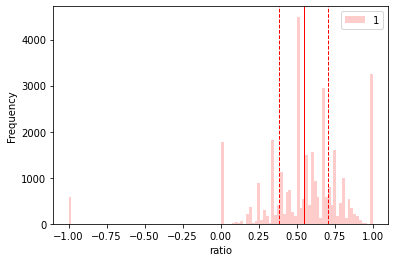

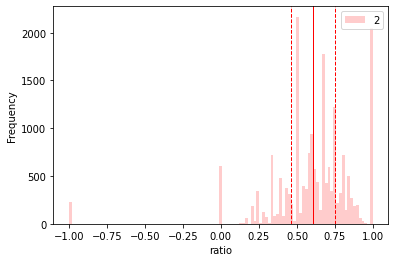

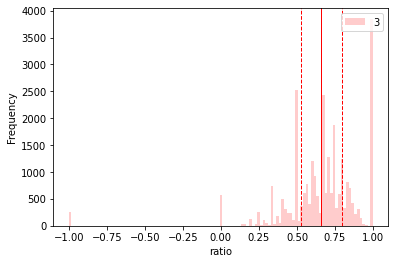

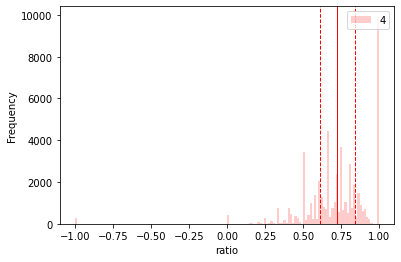

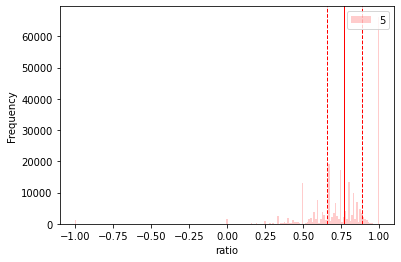

In [ ]:
import matplotlib.pyplot as plt

one_star = train_df[train_df['Score'] == 1]
two_star = train_df[train_df['Score'] == 2]
three_star = train_df[train_df['Score'] == 3]
four_star = train_df[train_df['Score'] == 4]
five_star = train_df[train_df['Score'] == 5]

df_list = [one_star['ratio'].values, two_star['ratio'].values, three_star['ratio'].values,
           four_star['ratio'].values, five_star['ratio'].values]
count = 1
for df_val in df_list:
  plt.hist([df_val], bins = 'auto', color = 'r', alpha = 0.2, label = count)
  plt.axvline(np.array([df_val]).mean(), color = 'red', linewidth = 1)
  plt.axvline(np.array([df_val]).mean() - 0.5*np.array([df_val]).std(), color='red',linestyle='dashed', linewidth=1)
  plt.axvline(np.array([df_val]).mean() + 0.5*np.array([df_val]).std(), color='red',linestyle='dashed', linewidth=1)
  plt.legend(loc = "upper right")
  plt.xlabel("ratio")
  plt.ylabel("Frequency")
  plt.show()
  count += 1

In [ ]:
thresh1 = 0.4
thresh2 = 0.6
thresh3 = 0.75
thresh4 = 0.8

def get_pred_score(ratio):
  if ratio <= thresh1:
    pred_score = 1
  elif ratio <= thresh2:
    pred_score = 2
  elif ratio <= thresh3:
    pred_score = 3
  elif ratio <= thresh4:
    pred_score = 4
  else:
    pred_score = 5

  return pred_score

print(get_pred_score(0.65))

3


In [ ]:
val_df["pred_score"] = val_df['ratio'].apply(get_pred_score)
print(val_df.columns)

Index(['Unnamed: 0', 'Id', 'ProductId', 'UserId', 'ProfileName',
       'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time',
       'Summary', 'Text', 'ratio', 'pos_count', 'neg_count', 'pred_score'],
      dtype='object')


24155
4831
6594
0.271089339489657


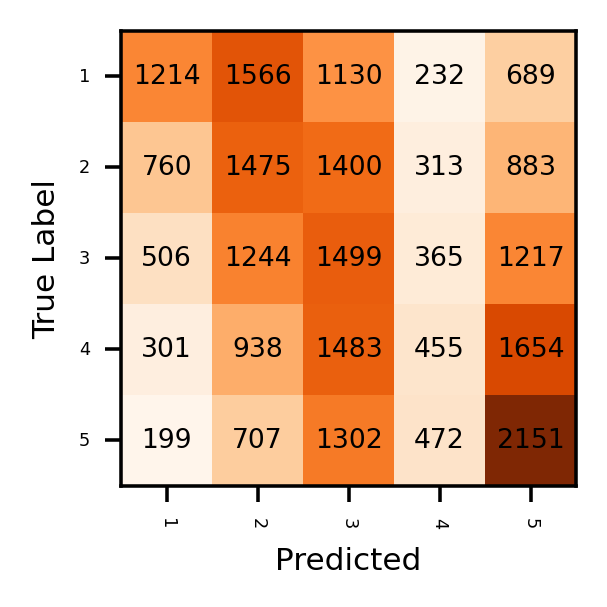

In [ ]:
from sklearn.metrics import f1_score

correct_labels = val_df['Score'].to_list()
predict_labels = val_df['pred_score'].to_list()
labels = [1, 2, 3, 4, 5]
display_labels = ["1","2", "3", "4", "5"]

print(len(correct_labels))
print(correct_labels.count(5))
print(predict_labels.count(5))

print(f1_score(correct_labels, predict_labels, average = "macro"))
plot_confusion_matrix(correct_labels, predict_labels, labels, display_labels=display_labels )

Now, we train a logistic regression classifier, where the inputs to the logistic regression classifier are the number of positively and negatively connoted words in the sentence. We also tune the hyperparameters using the validation set. We create a test set from the training set, train the logistic regression using the hyperparameters obtained from tuning on the validation set.


In [ ]:

from sklearn.model_selection import train_test_split

X = train_df[['pos_count','neg_count']].values
Y = train_df['Score'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size = 0.9, random_state = 42)

X_val = val_df[['pos_count','neg_count']].values
y_val = val_df['Score'].values

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate

reg=['none','l1','l2']
max_score=0
max_reg=' '
for r in reg:
  if(r=='l1'):
    solv='saga'
  else:
    solv='lbfgs'
  clf=LogisticRegression(penalty=r,random_state=42,solver=solv,max_iter=1e7)
  d=cross_validate(clf,X_val,y_val)
  score=d['test_score'].mean()
  print(d['test_score'])
  print(score)
  if(score>=max_score):
    max_score=score
    max_reg=r

print(max_reg)  

[0.29 0.29 0.28 0.3  0.3 ]
0.2927344235148002
[0.29 0.29 0.28 0.3  0.3 ]
0.2927344235148002
[0.29 0.29 0.28 0.3  0.3 ]
0.2927344235148002
l2


In [ ]:
clf_max=LogisticRegression(penalty='none',random_state=0,solver='lbfgs',max_iter=1e7)
clf_max.fit(X_train,y_train).score(X_train,y_train)

0.638193318246093

In [ ]:
from sklearn import metrics
y_pred=clf_max.predict(X_train)

metrics.accuracy_score(y_train,y_pred)
print(f1_score(y_train, y_pred, average = "macro"))
# plot_confusion_matrix(y_test, y_pred, labels, display_labels=display_labels )

0.1780012805548878


In [ ]:
from sklearn import metrics
y_pred=clf_max.predict(X_val)

metrics.accuracy_score(y_val,y_pred)
print(f1_score(y_val, y_pred, average = "macro"))
# plot_confusion_matrix(y_test, y_pred, labels, display_labels=display_labels )

0.09097034599625695


0.17539444005611174


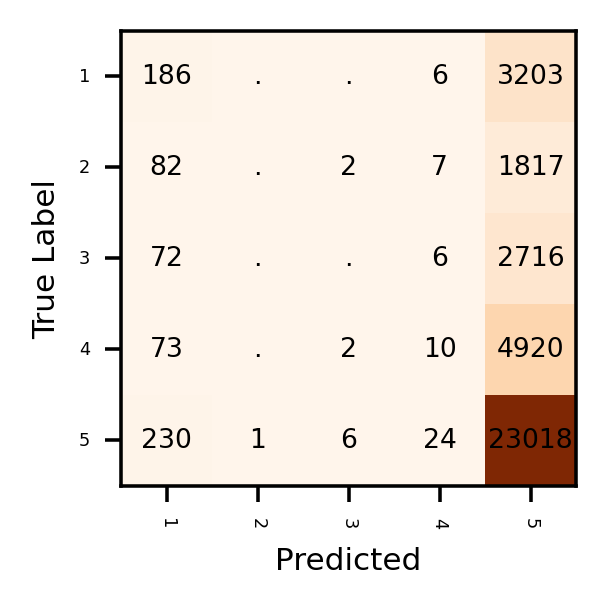

In [ ]:
from sklearn import metrics
y_pred=clf_max.predict(X_test)

metrics.accuracy_score(y_test,y_pred)
print(f1_score(y_test, y_pred, average = "macro"))
plot_confusion_matrix(y_test, y_pred, labels, display_labels=display_labels )

We also compare the results from the logistic regression baseline and the thresholding baseline in the writeup/Report.


# Featurizing the dataset using torchtext 

Data for computer vision is relatively easy to format, simply resize or pad it to a standard format and we can feed it into a neural network. However, text data typically requires more processing before it can be used seamlessly with PyTorch. Thankfully, Pytorch created torchtext, which (similar to torchvision) provides the preprocessing tools to work with textual data.

In this section, we create and featurize a torchtext dataset with Fields, a data structure that can automatically featurize text with its corresponding word embeddings. We will be using the same dataset for the review classification and the summary generation task. .





## Creating torchtext data fields 

First, we create TorchText "Fields". Fields describe how to process the input data so it can later be converted to a tensor. For the classification task, we need only two fields from the data - the review text and the review score. And thus we create two torchtext data fields using data.Field from torchtext.data. The documentation for torchtext is [here](https://torchtext.readthedocs.io/en/latest/).


*   A sequential field named TEXT for the review text.  (* since this is natural language, this is sequential data.  Also,  we use the "spacy" tokenizer to tokenize the text. This tokenizer handles converting a string into a series of single words [here](https://spacy.io/usage/linguistic-features#tokenization). Also to standardize the tokens, we made it lowercase.*)
*   A non-sequential field named SCORE for the scores.  (*since this is a categorical variable, it is not sequential.  Furthermore, it does not require a vocabulary since there are no words to embed.*)


In [ ]:
train_df.head

<bound method NDFrame.head of         Unnamed: 0  ...                                               Text
0           277345  ...  These remind of a product called Munchos that ...
1           259590  ...  I wouldn't describe these as the best dried ch...
2           495306  ...  Emeril's Chicken Rub changed the this family e...
3           355370  ...  Caribou makes a mean cup of coffee. It basical...
4            78998  ...  Hi<br />My order arrived quickly, in good cond...
...            ...  ...                                                ...
363805      250819  ...  This is a great drink and is a shame it has be...
363806      103538  ...  This is the best coconut juice water I've ever...
363807      215890  ...  I ordered these and got them on time and the  ...
363808      311272  ...  Great product.  My husband loved the original ...
363809      554397  ...  Surprisingly dry and tough, though well within...

[363810 rows x 11 columns]>

In [ ]:
train_df2 = train_df[["Text", "Score"]]
train_df2.columns

train_df2.to_csv("/content/drive/My Drive/CIS 522 HW4/train_q2.csv")

In [ ]:
val_df2 = val_df[["Text","Score"]]
val_df2.columns

val_df2.to_csv("/content/drive/My Drive/CIS 522 HW4/val_q2.csv")

In [ ]:
# TODO: INSERT CODE HERE
import torch
from torchtext import data

TEXT = data.Field(sequential = True, tokenize = 'spacy', lower = True, include_lengths = True)

SCORES = data.Field(sequential = False, use_vocab = False)

##  Create a Tabular Dataset 

Now that we've defined the two Fields which determine how to process our data, we produce a dataset with our data! TorchText provides a class called a ```TabularDataset``` which reads in the input data (in this case in the form of a CSV file) and produces a Dataset from it.
[documentation](https://torchtext.readthedocs.io/en/latest/data.html#tabulardataset) 

We create two tabular datasets, one for our training data and one for testing data.  We need the paths to the training and validation datasets, the format, and the mapping from columns to fields.  

The mapping from columns to fields is provided as a list of tuples where the first tuple element is the name of the column in the csv and the second element is the corresponding Field created in the previous step. Columns which we do not use/require need to be indicated by using *None* for that column in place of the field.

Note that the first column in the csv's should not be a field. Also note that while loading the dataset, we would want to ignore the first row (which represents the header).





In [ ]:

datafields = [(" ", None),
              ("Text", TEXT),
              ("Score", SCORES)]

training_data=data.TabularDataset(path = "/content/drive/My Drive/CIS 522 HW4/train_q2.csv",\
                                  format = 'csv',\
                                  fields = datafields,\
                                  skip_header = True)

testing_data = data.TabularDataset(path = "/content/drive/My Drive/CIS 522 HW4/val_q2.csv",\
                                   format = 'csv',\
                                   fields = datafields,\
                                   skip_header = True)

 Now, we use the dataset created above to print 5 examples of reviews and their rating. 


In [ ]:
# TODO: INSERT CODE HERE
count = 0
for example in training_data:
  count += 1
  print("\n")
  print("Review: ", example.Text)
  print("Rating: ", example.Score)

  if count == 5:
    break



Review:  ['these', 'remind', 'of', 'a', 'product', 'called', 'munchos', 'that', 'i', 'liked', 'a', 'long', 'time', 'ago', 'in', 'regards', 'to', 'flavor', '.', 'great', 'crunch', 'and', 'salt', 'level', '.', 'i', 'wish', 'they', 'packages', 'a', 'bit', 'bigger', 'than', 'the', '0.8', 'and', 'smaller', 'than', '3', 'oz', '.', ' ', 'the', '0.8', 'is', 'nt', 'quite', 'enough', 'and', 'the', '3', 'is', 'too', 'much', '.', 'about', '1.5', 'oz', 'would', 'be', 'right', 'for', 'my', 'appetite', '.']
Rating:  4


Review:  ['i', 'would', "n't", 'describe', 'these', 'as', 'the', 'best', 'dried', 'cherries', 'i', 'have', 'ever', 'eaten', 'but', 'they', 'were', 'pretty', 'good.<br', '/><br', '/>traverse', 'uses', 'oil', 'with', 'the', 'cherries', 'to', 'prevent', 'caking', ',', 'a', 'little', 'to', 'much', 'in', 'my', 'opinion', '.', ' ', 'these', 'cherries', 'unlike', 'the', 'blueberries', 'i', 'bought', 'from', 'them', 'were', 'not', 'as', 'effected', 'taste', 'wise', 'as', 'the', 'blue', 'ber

In [ ]:
count = 0
for example in repo_data:
  count += 1
  print("\n", count)
  print("Review: ", example.Text)
  if count == 5:
    break


 1
Review:  ['when', 'you', 'have', 'to', 'eat', 'sugar', '-', 'free', 'foods', 'for', 'health', 'reasons', 'you', 'feel', 'deprived', 'sometimes', 'but', 'i', 'certainly', 'did', 'nt', 'after', 'eating', 'these', '.', ' ', 'they', 'taste', 'exactly', 'like', 'oreos', 'should', '.', ' ', 'they', 'really', 'are', 'a', 'blessing', '.', ' ', 'you', 'could', 'eat', 'the', 'whole', 'box', 'but', 'they', 'have', 'a', 'chemical', 'in', 'them', 'called', 'maltitol', 'that', 'if', 'you', 'eat', 'too', 'many', 'you', 'might', 'have', 'to', 'use', 'the', 'bathroom', 'in', 'a', 'hurry', '.', ' ', 'which', 'is', 'good', 'because', 'it', 'actually', 'prevents', 'you', 'from', 'eating', 'the', 'whole', 'box.<br', '/><br', '/>i', 'love', 'sugar', '-', 'free', 'oreos', '!', '!', '!']

 2
Review:  ['this', 'coffee', 'is', 'very', 'smooth', 'and', 'has', 'a', 'great', 'flavor', ',', 'medium', 'roast', ',', 'without', 'being', 'bitter.<br', '/><br', '/>the', 'pods', 'do', 'not', 'fit', 'in', 'a', 'keurig

## Build Vocab 

Now that we have our text parsed, how do we actually represent our data as tensors? To do this, we use word embeddings. Using these word embeddings, we then build our vocabulary with GloVE, a word embedding similar to Word2Vec.  We create a vocabulary from the Field created previously using the train dataset.  We use the glove.6B.300d word embedding, and save the vocabulary. The pretrained model is stored in the ./.vector_cache folder, and rerunning this command takes negligible time.

Note that we can pass more than one datafield to the `build_vocab` function. We build a single vocab for both, the training data and validation data.



In [ ]:

TEXT.build_vocab(training_data, testing_data, min_freq = 3, vectors="glove.6B.300d")

.vector_cache/glove.6B.zip: 862MB [06:36, 2.17MB/s]                           
100%|█████████▉| 399220/400000 [00:39<00:00, 10217.91it/s]

In [ ]:
print("freqs: ",TEXT.vocab.freqs)

freqs:  Counter({'.': 1643842, 'the': 1270835, ',': 1193038, 'i': 1118052, 'and': 874796, 'a': 828718, 'it': 722915, 'to': 694461, ' ': 675296, 'of': 550613, 'is': 513625, 'this': 453090, 'for': 374243, 'in': 372480, 'that': 311515, 'my': 310903, '!': 260769, 'but': 257845, 'you': 248753, 'have': 242491, 'with': 240358, 'not': 238838, 'was': 230021, 'are': 222489, 'they': 211786, "n't": 204497, "'s": 202884, '-': 198932, 'as': 189248, 'on': 185165, '/><br': 177371, 'like': 175938, 'so': 170176, 'these': 155742, '"': 148747, 'them': 141283, 'good': 134442, '(': 131887, 'be': 130247, 'or': 122366, 'at': 122300, ')': 119630, 'do': 118642, 'one': 118534, 'just': 117878, 'taste': 117387, 'very': 114179, 'product': 113055, 'coffee': 112727, 'if': 111938, 'great': 109481, 'all': 106859, 'from': 100005, 'flavor': 99531, 'can': 99377, 'we': 95180, 'would': 94047, 'more': 92531, 'tea': 91855, 'when': 91614, 'has': 90721, 'had': 88505, 'me': 87723, 'will': 86487, 'food': 85959, 'love': 85087, 'ou

In [ ]:
print("itos: ",TEXT.vocab.itos)

itos:  ['<unk>', '<pad>', '.', 'the', ',', 'i', 'and', 'a', 'it', 'to', ' ', 'of', 'is', 'this', 'for', 'in', 'that', 'my', '!', 'but', 'you', 'have', 'with', 'not', 'was', 'are', 'they', "n't", "'s", '-', 'as', 'on', '/><br', 'like', 'so', 'these', '"', 'them', 'good', '(', 'be', 'or', 'at', ')', 'do', 'one', 'just', 'taste', 'very', 'product', 'coffee', 'if', 'great', 'all', 'from', 'flavor', 'can', 'we', 'would', 'more', 'tea', 'when', 'has', 'had', 'me', 'will', 'food', 'love', 'out', 'than', 'get', 'no', 'other', 'some', 'about', 'up', '/', 'really', 'only', 'much', 'too', 'an', 'your', 'there', 'because', 'were', '...', 'also', 'little', 'use', 'time', 'what', 'amazon', 'did', "'ve", 'which', 'she', 'been', 'buy', 'he', 'tried', 'does', 'by', 'even', 'best', 'am', 'price', 'find', 'make', 'after', "'m", 'better', 'well', 'dog', '<', 'try', 'eat', 'any', 'now', 'cup', 'their', 'first', 'water', 'chocolate', 'could', 'her', 'our', 'bag', 'sugar', 'then', 'br', '/>i', 'used', 'found

In [ ]:
print("stoi: ", TEXT.vocab.stoi)

stoi:  defaultdict(<function _default_unk_index at 0x7f33cefe5048>, {'<unk>': 0, '<pad>': 1, '.': 2, 'the': 3, ',': 4, 'i': 5, 'and': 6, 'a': 7, 'it': 8, 'to': 9, ' ': 10, 'of': 11, 'is': 12, 'this': 13, 'for': 14, 'in': 15, 'that': 16, 'my': 17, '!': 18, 'but': 19, 'you': 20, 'have': 21, 'with': 22, 'not': 23, 'was': 24, 'are': 25, 'they': 26, "n't": 27, "'s": 28, '-': 29, 'as': 30, 'on': 31, '/><br': 32, 'like': 33, 'so': 34, 'these': 35, '"': 36, 'them': 37, 'good': 38, '(': 39, 'be': 40, 'or': 41, 'at': 42, ')': 43, 'do': 44, 'one': 45, 'just': 46, 'taste': 47, 'very': 48, 'product': 49, 'coffee': 50, 'if': 51, 'great': 52, 'all': 53, 'from': 54, 'flavor': 55, 'can': 56, 'we': 57, 'would': 58, 'more': 59, 'tea': 60, 'when': 61, 'has': 62, 'had': 63, 'me': 64, 'will': 65, 'food': 66, 'love': 67, 'out': 68, 'than': 69, 'get': 70, 'no': 71, 'other': 72, 'some': 73, 'about': 74, 'up': 75, '/': 76, 'really': 77, 'only': 78, 'much': 79, 'too': 80, 'an': 81, 'your': 82, 'there': 83, 'beca

In [ ]:
print("vectors: ", TEXT.vocab.vectors)

vectors:  tensor([[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [-0.1256,  0.0136,  0.1031,  ..., -0.3422, -0.0224,  0.1368],
        ...,
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]])


##. Create an iterator for the dataset 

Now, we create a `BucketIterator` for the training data and the validation data. The `BucketIterator` is equivalent to the `DataLoader`. It splits the data into batches which can be used with recurrent models. This will create batches and add `<pad>` token so that each batch will have the same length. `BucketIterator` creates batches such that the amount of padding is minimum. We sort each batch by the length of the text in decreasing order (this is required for passing the batch through recurrent layers). 

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:

BATCHSIZE = 64

train_iterator = data.BucketIterator(
    training_data,
    batch_size = BATCHSIZE,
    sort_key = lambda x: len(x.Text),
    sort_within_batch = True,
    repeat = False,
    shuffle = True,
    device = device
)

val_iterator = data.BucketIterator(
    testing_data,
    batch_size = 1,
    sort = False,
    sort_key = lambda x: len(x.Text),
    sort_within_batch = False,
    repeat = False,
    shuffle = False,
    device = device
)

print("Done")

Done


In [ ]:
count = 0
for batch in (val_iterator):
  count += 1
  text, text_length = batch.Text
  print(text)
  print(text_length)
  if count == 1:
    break


tensor([[ 293],
        [1234],
        [  25],
        [  48],
        [ 238],
        [  14],
        [  13],
        [  49],
        [  29],
        [ 165],
        [   0],
        [  14],
        [   7],
        [ 358],
        [ 856],
        [   2],
        [ 139]])
tensor([17])


##  Get frequency distribution per class

We print the frequency distribution for each class for the training data and the validation data. The frequencies are reported in our write-up.

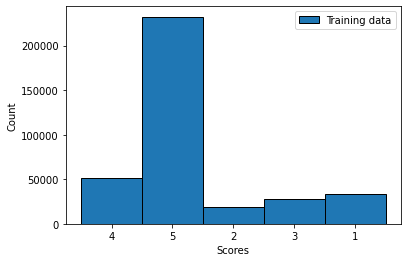

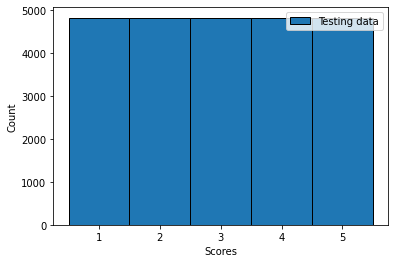

In [ ]:

import matplotlib.pyplot as plt


train_labels = []
val_labels = []
for i, data in enumerate(training_data):
  train_labels.append(data.Score)

for i,data in enumerate(testing_data):
  val_labels.append(data.Score)

plt.hist(train_labels, edgecolor = 'black',
         bins = np.array([0,1,2,3,4,5]) - 0.5, label = "Training data")
plt.xlabel("Scores")
plt.ylabel("Count")
plt.legend(loc = "upper right")
plt.show()

plt.hist(val_labels, edgecolor = 'black',
         bins = np.array([0,1,2,3,4,5]) - 0.5, label = "Testing data")
plt.xlabel("Scores")
plt.ylabel("Count")
plt.legend(loc = "upper right")


#  Recurrent Amazon Reviews Classifier

We now build the model for predicting the rating given the review. 

As we are working with text, we first build a model which uses recurrent layers. We define a model for the classifier which uses *RNN*, *GRU*, *LSTM* and *BiLSTM* layers to predict the rating. We made a single model with a `mode` parameter which defines which of the four recurrent layers to use as it made the process much quicker.

**Defining the basic recurrent model**

The model has a `nn.Embedding` layer whose weights are initialized to the pretrained embeddings downloaded above. The hidden state output from the last timestep is passed to fully connected layers to produce the output. For the *BiLSTM* model, we either add or concatenate the hidden state for the two directions depending on another bilstm mode parameter.

We use the *F1 score* to monitor performance of the model and use `sklearn.metrics.f1_score` to calculate the F1 score.

**NOTE:** We also use `nn.utils.rnn.pad_packed_sequence` before passing the input to the recurrent layers. This makes sure the padding is ignored for every sample in a batch and the output is from the actual last token for every sequence.


In [ ]:
from sklearn.metrics import f1_score

def train_classifier(model, dataset_iterator, loss_function, optimizer, \
                     num_epochs = 10, logger = None, verbose = True, print_every = 100, recurrent = False, model_name = "recurrent"):
  
  model.train()
  step = 0
  for epoch in range(num_epochs):
    correct = 0
    total = 0
    total_loss = 0

    for batch in dataset_iterator:
      text, text_lengths = batch.Text
      scores = batch.Score

      batch_size = len(scores)

      optimizer.zero_grad()
      if recurrent:
        output = model(text, text_lengths).squeeze(1)
      else:
        output = model(text).squeeze(1)

      scores = scores.type_as(output) - 1

      loss = loss_function(output, scores.long())
      loss.backward() 
      optimizer.step()

      _,pred = torch.max(output,1) 
      correct += (torch.sum(pred == scores)).item()
      total += len(scores)
      total_loss += loss.item()

      if ((step % print_every) == 0):
        logger.add_scalar("Loss/train", total_loss/total, step)
        logger.add_scalar("Acc/train", correct/total, step)
        logger.add_scalar("F1_Score", f1_score(scores.cpu(), pred.cpu(), average = "macro"), step)
        if verbose:
          print("--- Step: %s Acc: %s Loss: %s" %(step, correct/total, total_loss/total))
      step = step+1

    print("Epoch: %s Acc: %s Loss: %s"%(epoch+1, correct/total, total_loss/total))
    print("Epoch: %s F1_Score: %s"%(epoch+1, f1_score(scores.cpu(), pred.cpu(), average = "macro")))
    torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': total_loss/total,
            'accuracy': correct/total
            }, "/content/drive/My Drive/CIS 522 HW4/models/recurrent-%s-%d.pt"%(model_name, int(epoch+1)))


def evaluate_classifier(model, dataset_iterator, loss_function, recurrent = False):
  model.eval()

  correct = 0
  total = 0
  total_loss = 0
  y_pred = []
  y_true = []
  for batch in dataset_iterator:
    text, text_lengths = batch.Text
    scores = batch.Score

    if text_lengths == 0:
      continue
    
    if recurrent:
      output = model(text, text_lengths).view(1,-1)
    else:
      output = model(text)
    
    scores = scores.type_as(output) - 1
    # import pdb;
    # pdb.set_trace()
    loss = loss_function(output, scores.long())

    # pred = torch.round(output.data) 
    _,pred = torch.max(output,1)
    y_pred.append(pred[0].cpu() + 1)
    y_true.append(scores[0].cpu() + 1)
    # print(pred[0])
    correct += (torch.sum(pred == scores)).item()
    total += len(scores)
    total_loss += loss.item()

  print("Test statistics: Acc: %s Loss: %s, F1_score: %s"%(correct/total, total_loss/total, f1_score(y_true, y_pred, average="macro")))
  labels = [1,2,3,4,5]
  display_labels = ["1", "2", "3", "4", "5"]
  plot_confusion_matrix(y_true, y_pred, labels, display_labels=display_labels )

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class ReviewClassifier(nn.Module):
    """ 
    Review Classifier
  
  
    Parameters: 
    mode (string): Type of recurrent layer being used. Types are ['rnn', 'lstm', 'gru', 'bilstm']
    output_size (int): Size of the last layer for classification (hint: how many classes do you have?)
    hidden_size (int): Length of your hidden state vector
    vocab_size (int): Length of your vocab (can get this by doing len(TEXT.vocab))
    embedding_length (int): Dimension of your word embedding vector (hint: look at part 2c)
    word_embeddings (Tensor): All of the word embeddings generated. Can get this from TEXT.vocab.vectors
    bilstm_mode: concatenate or add the hidden texts
    """
    def __init__(self, mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = None):
      super(ReviewClassifier, self).__init__()

      self.output_size = output_size
      self.hidden_size = hidden_size
      self.vocab_size = vocab_size
      self.embedding_length = embedding_length
      self.word_embeddings = word_embeddings
      self.mode = mode
      self.bilstm_mode = bilstm_mode


      #embedding layers
      self.embeddings = nn.Embedding(self.vocab_size, self.embedding_length)
      self.embeddings.weight = nn.Parameter(word_embeddings, requires_grad = False)

      if mode not in ['lstm', 'rnn', 'gru', 'bilstm']:
        raise ValueError("Choose a mode from - rnn / lstm / gru / bilstm")

      #Recurrent layer
      if mode == 'lstm':
        self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'rnn':
        self.recurrent = nn.RNN(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'gru':
        self.recurrent = nn.GRU(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'bilstm':
        self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = True)
        
      #Fully-connected Layer
      self.fc3 = nn.Linear(2*self.hidden_size, self.hidden_size)
      self.fc1 = nn.Linear(self.hidden_size, int(self.hidden_size/2))
      self.fc2 = nn.Linear(int(self.hidden_size/2), self.output_size)

    def forward(self, text, text_lengths):
      # print("text: ",text.shape)
      embedded_text = self.embeddings(text)
      # print("embedded text: ", embedded_text.shape)

      packed_text = nn.utils.rnn.pack_padded_sequence(embedded_text, text_lengths)

      if (self.mode == 'lstm'):
        _, (hidden_text, _) = self.recurrent(packed_text)
      elif (self.mode == "rnn" or self.mode == "gru"):
        (_, hidden_text) = self.recurrent(packed_text)
      elif (self.mode == "bilstm"):
        _, (hidden_text_con, _) = self.recurrent(packed_text)
        hidden_text1 = hidden_text_con[0]
        hidden_text2 = hidden_text_con[1]
          
      # print("hidden text: ", hidden_text_con.shape)

      if (self.bilstm_mode == "add"):
        hidden_text = hidden_text1 + hidden_text2

      if (self.bilstm_mode == "con"):
        
        hidden_text = torch.cat((hidden_text1, hidden_text2), dim=1)
        fc_input3 = hidden_text.squeeze(0)
        fc_input = self.fc3(fc_input3)

      if (self.bilstm_mode != "con"):
        fc_input = hidden_text.squeeze(0)
        # print("fc_input", fc_input.shape)

      temp = F.relu(self.fc1(fc_input))
      # print("temp: ", temp.shape)

      prediction = self.fc2(temp)
      # print("prediction: ", prediction.shape)

      return prediction

In [ ]:
import os

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

# Load the TensorBoard notebook extension
%load_ext tensorboard

from torch.utils.tensorboard import SummaryWriter

ROOT_LOG_DIR = "/content/drive/My Drive/CIS 522 HW4/Logs"
TENSORBOARD_DIR = "Q3_2" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir {ROOT_LOG_DIR.replace(" ", "\\ ")}

<IPython.core.display.Javascript object>

**Train the Recurrent Models**

We train the model defined above with *LSTM* as the recurrent layer. Use the standard `nn.CrossEntropyLoss` as the loss function.  We report the final training F1 score and the final training loss of the model (trained only on the training set). We use the trained model to evaluate on the validation data.  
Confusion matrix, final hyperparameter choices and hyper parameter tuning process has been reported in the write up. 



### **LSTM UNWEIGHTED**

In [ ]:
TENSORBOARD_DIR = "2_Q3_lstm_uw_256" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 6
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

model_lstm = ReviewClassifier(mode_list[0], output_size, hidden_size, vocab_size, embedding_length, word_embeddings)
model_lstm = model_lstm.to(device)

loss_function = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model_lstm.parameters(), lr=1e-4)
log_dir = 'runs/recurrent'

train_classifier(model_lstm, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True, model_name= "2_lstm_uw_256")

--- Step: 0 Acc: 0.15625 Loss: 0.024981768801808357
--- Step: 100 Acc: 0.6064356435643564 Loss: 0.019883708170808777
--- Step: 200 Acc: 0.6219682835820896 Loss: 0.018726639950008533
--- Step: 300 Acc: 0.6321117109634552 Loss: 0.018154665246061314
--- Step: 400 Acc: 0.6342347256857855 Loss: 0.017839609696402067
--- Step: 500 Acc: 0.6334206586826348 Loss: 0.017549166312727505
--- Step: 600 Acc: 0.6337874376039934 Loss: 0.017291757123182202
--- Step: 700 Acc: 0.6358327389443652 Loss: 0.017066673002339973
--- Step: 800 Acc: 0.6363139825218477 Loss: 0.01688820555848017
--- Step: 900 Acc: 0.6380584073251943 Loss: 0.01667797068996018
--- Step: 1000 Acc: 0.6391264985014985 Loss: 0.016558042434337256
--- Step: 1100 Acc: 0.6407385331516803 Loss: 0.016420765719008544
--- Step: 1200 Acc: 0.6420821190674438 Loss: 0.016303008937545983
--- Step: 1300 Acc: 0.6433993082244427 Loss: 0.016190322141430062
--- Step: 1400 Acc: 0.6442496431120628 Loss: 0.016118091270181323
--- Step: 1500 Acc: 0.6453822451698

Test statistics: Acc: 0.5225833160836266 Loss: 1.1225243179750255, F1_score: 0.48042686621002473


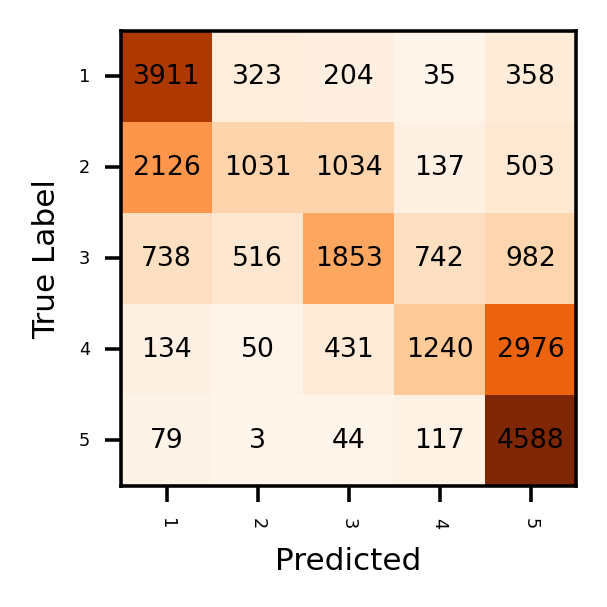

In [ ]:
evaluate_classifier(model_lstm, val_iterator, loss_function, recurrent = True)

From the confusion matrix, it can be observed that the number of false positives for class 1 and 5 are high.  This is because from the frequency distribution of the training data it is seen that the number of labels belonging to class 1 and 5 are high compared to other classes. Hence, due to this class imbalance the network classifies more examples to these two classes.This imbalance in classes in the training data can be fixed by weighing the loss in the inverse pro-portion of the class frequencies. The fewer the no. of samples in a class, the higher the weightage in the loss for that class.The weight vector hence would be: [1/33400,1/19048,1/27397,1/51496,1/232469]

### **LSTM WEIGHTED**

In [ ]:
TENSORBOARD_DIR = "2_Q3_lstm_w_256" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 5
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

model_lstm_weighted = ReviewClassifier(mode_list[0], output_size, hidden_size, vocab_size, embedding_length, word_embeddings)
model_lstm_weighted = model_lstm_weighted.to(device)

weights = [1/33400, 1/19048, 1/27397, 1/51496, 1/232469]
class_weights = torch.FloatTensor(weights).to(device)
loss_function = nn.CrossEntropyLoss(weight = class_weights)

optimizer = torch.optim.Adam(model_lstm_weighted.parameters(), lr=1e-4)
log_dir = 'runs/recurrent'

train_classifier(model_lstm_weighted, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True, model_name= "2_lstm_w_256")

--- Step: 0 Acc: 0.0625 Loss: 0.025016512721776962
--- Step: 100 Acc: 0.24860767326732675 Loss: 0.025081528258500713
--- Step: 200 Acc: 0.30651430348258707 Loss: 0.025015879487294463
--- Step: 300 Acc: 0.33482142857142855 Loss: 0.0248589764884441
--- Step: 400 Acc: 0.342425187032419 Loss: 0.02471811444198996
--- Step: 500 Acc: 0.3351110279441118 Loss: 0.02465071478958972
--- Step: 600 Acc: 0.3266690931780366 Loss: 0.02462985113374703
--- Step: 700 Acc: 0.32776836661911557 Loss: 0.024536763013642115
--- Step: 800 Acc: 0.3433013420724095 Loss: 0.02435682371919149
--- Step: 900 Acc: 0.35934031631520535 Loss: 0.024135141078378598
--- Step: 1000 Acc: 0.3741883116883117 Loss: 0.02391861889001492
--- Step: 1100 Acc: 0.38499091734786556 Loss: 0.02371381630581363
--- Step: 1200 Acc: 0.39390351790174855 Loss: 0.023563055834926037
--- Step: 1300 Acc: 0.40022098385857036 Loss: 0.023424791522913945
--- Step: 1400 Acc: 0.4076663990007138 Loss: 0.023285126260386715
--- Step: 1500 Acc: 0.4147131079280

Test statistics: Acc: 0.5502794452494307 Loss: 1.0593864830641477, F1_score: 0.5372616236869683


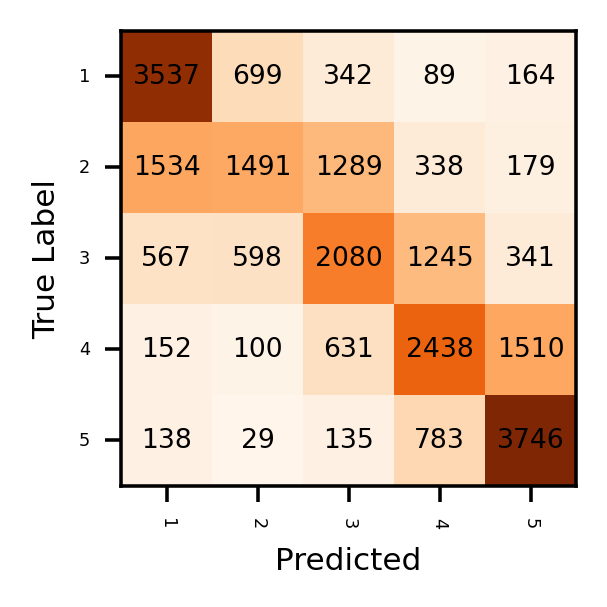

In [ ]:
evaluate_classifier(model_lstm_weighted, val_iterator, loss_function, recurrent = True)

**Q3d (2 pts):** Now redo 3b except with the fix for the problem that you noted in Q3c. Report all the same things in your writeup, and explain how adding this fix impacted results. Use the confusion matrix and the F1 Score in your analysis.

### **RNN WEIGHTED**

In [ ]:
TENSORBOARD_DIR = "2_Q3_rnn_w_256" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

print("Done")

Done


In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 6
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

model_rnn_weighted = ReviewClassifier(mode_list[1], output_size, hidden_size, vocab_size, embedding_length, word_embeddings)
model_rnn_weighted = model_rnn_weighted.to(device)

weights = [1/33400, 1/19048, 1/27397, 1/51496, 1/232469]
class_weights = torch.FloatTensor(weights).to(device)
loss_function = nn.CrossEntropyLoss(weight = class_weights)

optimizer = torch.optim.Adam(model_rnn_weighted.parameters(), lr=1e-4)
log_dir = 'runs/recurrent'

train_classifier(model_rnn_weighted, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True, model_name = "2_rnn_w_256")

--- Step: 0 Acc: 0.0625 Loss: 0.025309011340141296
--- Step: 100 Acc: 0.2311262376237624 Loss: 0.025004102322872323
--- Step: 200 Acc: 0.2579291044776119 Loss: 0.024921461448666467
--- Step: 300 Acc: 0.3014950166112957 Loss: 0.024819948800229946
--- Step: 400 Acc: 0.3442955112219451 Loss: 0.024518148690239154
--- Step: 500 Acc: 0.38254740518962077 Loss: 0.024306958976263057
--- Step: 600 Acc: 0.4008943427620632 Loss: 0.02408746035518543
--- Step: 700 Acc: 0.40769882310984307 Loss: 0.023940286991025683
--- Step: 800 Acc: 0.4165301186017478 Loss: 0.02377563329429811
--- Step: 900 Acc: 0.42681742508324083 Loss: 0.023630929730427384
--- Step: 1000 Acc: 0.430506993006993 Loss: 0.02350104950948969
--- Step: 1100 Acc: 0.4317807674841054 Loss: 0.02340322617884661
--- Step: 1200 Acc: 0.4357826810990841 Loss: 0.023325663128189997
--- Step: 1300 Acc: 0.43858089930822447 Loss: 0.023224267703434488
--- Step: 1400 Acc: 0.44188302997858675 Loss: 0.02314861327526741
--- Step: 1500 Acc: 0.4449950033311

Test statistics: Acc: 0.445373628648313 Loss: 1.3047112922220219, F1_score: 0.434461467971205


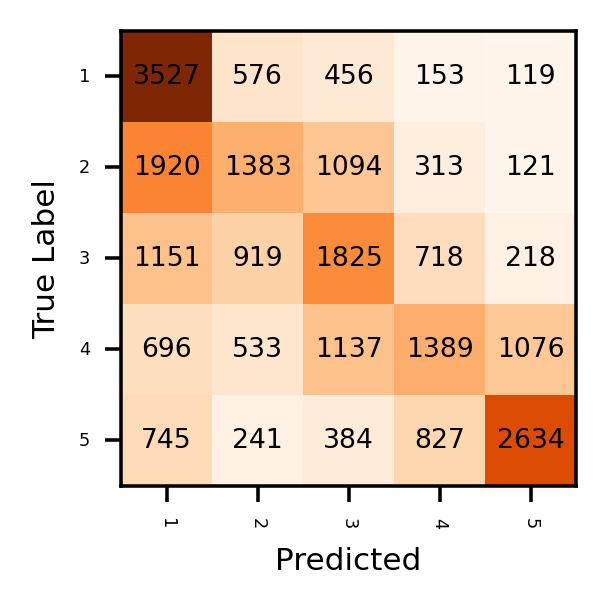

In [ ]:
evaluate_classifier(model_rnn_weighted, val_iterator, loss_function, recurrent = True)

### **GRU WEIGHTED**

In [ ]:
TENSORBOARD_DIR = "2_Q3_gru_w_256" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 6
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

model_gru_weighted = ReviewClassifier(mode_list[2], output_size, hidden_size, vocab_size, embedding_length, word_embeddings)
model_gru_weighted = model_gru_weighted.to(device)

weights = [1/33400, 1/19048, 1/27397, 1/51496, 1/232469]
class_weights = torch.FloatTensor(weights).to(device)
loss_function = nn.CrossEntropyLoss(weight = class_weights)

optimizer = torch.optim.Adam(model_gru_weighted.parameters(), lr=1e-4)
log_dir = 'runs/recurrent'

train_classifier(model_gru_weighted, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True, model_name = "2_gru_w_256")

--- Step: 0 Acc: 0.15625 Loss: 0.025125155225396156
--- Step: 100 Acc: 0.1848700495049505 Loss: 0.025056924154557805
--- Step: 200 Acc: 0.2462686567164179 Loss: 0.024947132887457733
--- Step: 300 Acc: 0.264015780730897 Loss: 0.0248534399644778
--- Step: 400 Acc: 0.3050576683291771 Loss: 0.024562504718502857
--- Step: 500 Acc: 0.33021457085828343 Loss: 0.024309183130721133
--- Step: 600 Acc: 0.3586210482529118 Loss: 0.02398601571367604
--- Step: 700 Acc: 0.38177603423680456 Loss: 0.02368818359521248
--- Step: 800 Acc: 0.39673064918851436 Loss: 0.023489381785454524
--- Step: 900 Acc: 0.41181673140954494 Loss: 0.023303993143447232
--- Step: 1000 Acc: 0.42288961038961037 Loss: 0.02313089349886754
--- Step: 1100 Acc: 0.4315253178928247 Loss: 0.02298844848454107
--- Step: 1200 Acc: 0.43999791840133223 Loss: 0.022837527671659818
--- Step: 1300 Acc: 0.4467837240584166 Loss: 0.02270471855431085
--- Step: 1400 Acc: 0.45303577801570305 Loss: 0.022559128617927655
--- Step: 1500 Acc: 0.458173717521

Test statistics: Acc: 0.5959014696750156 Loss: 0.9627067966109072, F1_score: 0.5890434159309359


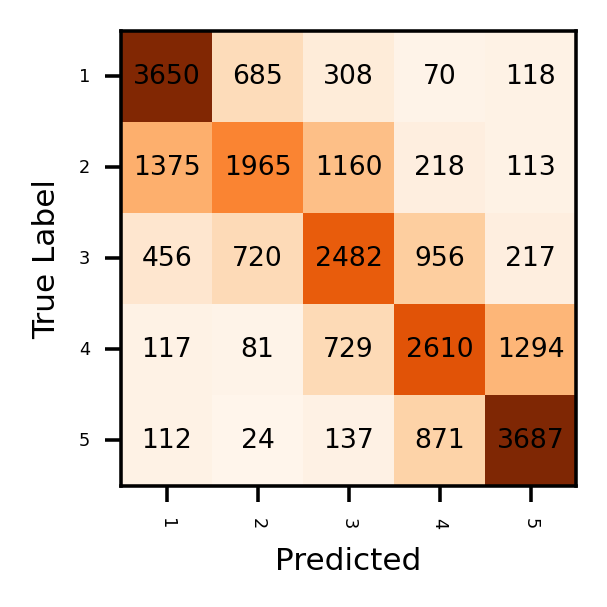

In [ ]:
evaluate_classifier(model_gru_weighted, val_iterator, loss_function, recurrent = True)

### **BiLSTM WEIGHTED ADD**

In [ ]:
TENSORBOARD_DIR = "2_bilstm_add_w_256" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 6
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

model_bilstm_weighted_add = ReviewClassifier(mode_list[3], output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = "add")
model_bilstm_weighted_add = model_bilstm_weighted_add.to(device)

weights = [1/33400, 1/19048, 1/27397, 1/51496, 1/232469]
class_weights = torch.FloatTensor(weights).to(device)
loss_function = nn.CrossEntropyLoss(weight = class_weights)

optimizer = torch.optim.Adam(model_bilstm_weighted_add.parameters(), lr=1e-4)
log_dir = 'runs/recurrent'

train_classifier(model_bilstm_weighted_add, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True, model_name= "2_bilstm_add_w_256")

--- Step: 0 Acc: 0.171875 Loss: 0.02499169483780861
--- Step: 100 Acc: 0.22385519801980197 Loss: 0.02507844799668482
--- Step: 200 Acc: 0.28995646766169153 Loss: 0.024901400148794425
--- Step: 300 Acc: 0.33456187707641194 Loss: 0.02457877093820873
--- Step: 400 Acc: 0.3716879675810474 Loss: 0.02421437568981154
--- Step: 500 Acc: 0.3950536427145709 Loss: 0.023808088042065054
--- Step: 600 Acc: 0.4125415973377704 Loss: 0.023452846423262567
--- Step: 700 Acc: 0.4271353423680456 Loss: 0.023132218459830985
--- Step: 800 Acc: 0.43853386392009985 Loss: 0.022874000827583035
--- Step: 900 Acc: 0.45041967258601556 Loss: 0.02264798400752023
--- Step: 1000 Acc: 0.4584165834165834 Loss: 0.02245922378644898
--- Step: 1100 Acc: 0.4633997502270663 Loss: 0.0223051345180534
--- Step: 1200 Acc: 0.4707145087427144 Loss: 0.022131355517356968
--- Step: 1300 Acc: 0.4748991160645657 Loss: 0.021993083742624014
--- Step: 1400 Acc: 0.4807503568879372 Loss: 0.021864248572620724
--- Step: 1500 Acc: 0.4846664723517

Test statistics: Acc: 0.5957772717863796 Loss: 0.9777307182917099, F1_score: 0.5916978489398367


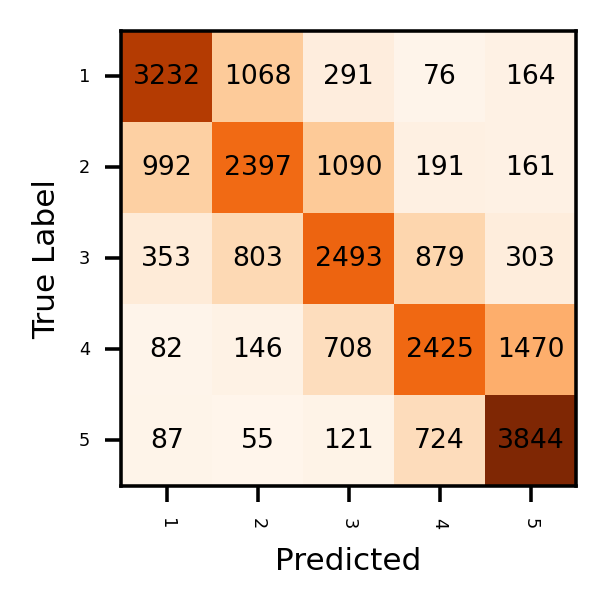

In [ ]:
evaluate_classifier(model_bilstm_weighted_add, val_iterator, loss_function, recurrent = True)

### **BiLSTM WEIGHTED CONCATENATE**

In [ ]:
TENSORBOARD_DIR = "Q3_bilstm_con_w_256" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 6
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

model_bilstm_weighted_con = ReviewClassifier(mode_list[3], output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = "con")
model_bilstm_weighted_con = model_bilstm_weighted_con.to(device)

weights = [1/33400, 1/19048, 1/27397, 1/51496, 1/232469]
class_weights = torch.FloatTensor(weights).to(device)
loss_function = nn.CrossEntropyLoss(weight = class_weights)

optimizer = torch.optim.Adam(model_bilstm_weighted_con.parameters(), lr=1e-4)
log_dir = 'runs/recurrent'

train_classifier(model_bilstm_weighted_con, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True, model_name= "2_bilstm_con_w_256")

--- Step: 0 Acc: 0.03125 Loss: 0.024939509108662605
--- Step: 100 Acc: 0.19291460396039603 Loss: 0.025121191830033123
--- Step: 200 Acc: 0.31747512437810943 Loss: 0.024941015497443094
--- Step: 300 Acc: 0.34099875415282394 Loss: 0.02460779502765087
--- Step: 400 Acc: 0.36327150872817954 Loss: 0.024263113978646344
--- Step: 500 Acc: 0.38772455089820357 Loss: 0.023955651426951805
--- Step: 600 Acc: 0.40417013311148087 Loss: 0.0237100468127184
--- Step: 700 Acc: 0.41532186162624823 Loss: 0.023532641421838765
--- Step: 800 Acc: 0.4276880461922597 Loss: 0.023382017661011622
--- Step: 900 Acc: 0.43340732519422864 Loss: 0.023247330810266913
--- Step: 1000 Acc: 0.4379995004995005 Loss: 0.023092124920029503
--- Step: 1100 Acc: 0.44131755222524977 Loss: 0.022980910461128677
--- Step: 1200 Acc: 0.44643786427976684 Loss: 0.02289456834738995
--- Step: 1300 Acc: 0.44930582244427364 Loss: 0.02276545706248737
--- Step: 1400 Acc: 0.45473099571734477 Loss: 0.022672185466241234
--- Step: 1500 Acc: 0.4586

Test statistics: Acc: 0.5261850548540675 Loss: 1.106679525269923, F1_score: 0.5135157861856483


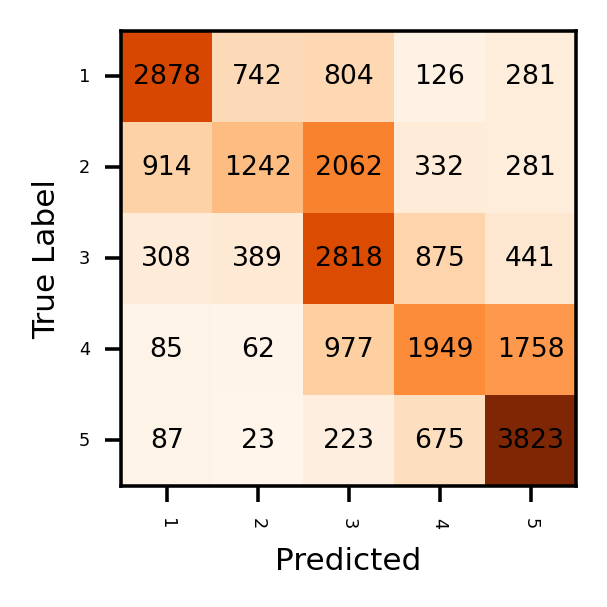

In [ ]:
evaluate_classifier(model_bilstm_weighted_con, val_iterator, loss_function, recurrent = True)

In [ ]:
def evaluate_classifier_submit(model, dataset_iterator, recurrent = False):
  model.eval()

  correct = 0
  total = 0
  total_loss = 0
  y_pred = []
  y_true = []
  for batch in dataset_iterator:
    text, text_lengths = batch.Text
    # scores = batch.Score

    if text_lengths == 0:
      continue
    
    if recurrent:
      output = model(text, text_lengths).view(1,-1)
    else:
      output = model(text)

    _,pred = torch.max(output,1)
    y_pred.append((pred[0].cpu() + 1).numpy())
    
    # scores = scores.type_as(output) - 1
    # import pdb;
    # pdb.set_trace()
    # loss = loss_function(output, scores.long())

    # pred = torch.round(output.data) 
    
    # y_true.append((scores[0].cpu() + 1).numpy())
    # print(pred[0])
    # correct += (torch.sum(pred == scores)).item()
    # total += len(scores)
    # total_loss += loss.item()

  # print("Test statistics: Acc: %s Loss: %s, F1_score: %s"%(correct/total, total_loss/total, f1_score(y_true, y_pred, average="macro")))
  # labels = [1,2,3,4,5]
  # display_labels = ["1", "2", "3", "4", "5"]
  # plot_confusion_matrix(y_true, y_pred, labels, display_labels=display_labels)
  return y_pred

#  Classifier with self-attention 

Now, we will implement the Review Classifier with self-attention. Self-attention is a technique where we score the input sequence hidden states with respect to the final hidden representation we use for classification. 

Attention is a very useful technique used in all of deep learning to figure out what parts of the input are more important for producing the output. This helps us use a more relevant feature representation of the input with respect to the end goal. In NLP applications, we typically want to know which words (or tokens) in the input sequence are important for our task. In this assignment, we are interested to figure out what words in the review text are the most important to predict the rating. We call it self-attention because the words from the same input sentence are attended on for the classification.

Article about attention [here](https://medium.com/datadriveninvestor/attention-in-rnns-321fbcd64f05).

Attention was originally introduced for encoder-decoder architectures used for machine translation in [this paper](https://arxiv.org/pdf/1409.0473.pdf).



## Define the attention module

We define an `Attention` module .Here, we implemented *additive attention*. So, the inputs to the attention will be passed through fully connected layers and finally through a softmax to output the `attention_scores`. The following figure summarizes the procedure to compute the `attention_scores`. We have implemented the `forward()` of the `Attention` module as per the figure.

![attention](https://i.imgur.com/uFdThV6.png)

To implement self-attention we first define an `Attention` module. This module will take as input the final representation with respect to which we want to attend on the input sequence (for this project, the last hidden state) and the output of the recurrent layer from each timestep and outputs `attention_scores` which is a probability distribution over each token in the input sequence representing the importance of each token for the final prediction.

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Attention(nn.Module):
  def __init__(self, hidden_size):
    super(Attention, self).__init__()
    self.layer1 = nn.Linear(3*hidden_size, 64)
    self.layer2 = nn.Linear(64,1)

  def forward(self, hidden, encoder_outputs):
    """ 
    Parameters: 
    hidden (vector): Final hidden state from the input sequence
    encoder_outputs (tensor): Hidden state produced from each of the input sequence tokens
    """

    repeat_hidden = hidden.expand(encoder_outputs.size(0),-1,-1)
    concatenated = torch.cat((encoder_outputs,repeat_hidden), dim=2)
    
    op1 = self.layer1(concatenated)
    op2 = self.layer2(op1)
    scores = torch.nn.functional.softmax(op2)

    return scores



## Define the classifier model with attention

Now, we define a model which uses the `Attention` module defined above. This model is the same as the one defined in previous sections except that we compute a `context` vector (calculated as a weighted average of the outputs for each timestep with weights from the `Attention` module) and then concatenate this vector with the last hidden state vector . The context vector concatenated with the last hidden state is then passed through fully connected layers to generate the final predictions.

**NOTE:** The recurrent layers expect input with the batch size at the second dimension and sequence length as the first dimension. The output also follows the same rule.

**NOTE:** We use `nn.utils.rnn.pad_packed_sequence` before passing the input to the recurrent layers. This makes sure the padding is ignored for every sample in a batch and the output will be from the last batch 

In [ ]:
class ReviewClassifierWithAttention(nn.Module):
  def __init__(self, mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, attention):
    super(ReviewClassifierWithAttention, self).__init__()
    self.output_size = output_size
    self.hidden_size = hidden_size
    self.vocab_size = vocab_size
    self.embedding_length = embedding_length
    self.word_embeddings = word_embeddings
    self.mode = mode
    self.attention = attention
    
    self.embeddings = nn.Embedding(self.vocab_size, self.embedding_length)
    self.embeddings.weight = nn.Parameter(word_embeddings, requires_grad = False)
    if mode not in ['rnn', 'lstm', 'gru', 'bilstm']:
      raise ValueError("Choose a mode from - rnn / lstm / gru / bilstm")
    if mode == 'lstm':
      self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
    elif mode == 'rnn':
      self.recurrent = nn.RNN(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
    elif mode == 'gru':
      self.recurrent = nn.GRU(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
    elif mode == 'bilstm':
      self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = True)


    self.fc3 = nn.Linear(3*self.hidden_size, self.output_size)
    self.fc1 = nn.Linear(self.hidden_size, int(self.hidden_size/2))
    self.fc2 = nn.Linear(int(self.hidden_size/2), self.output_size)

  def forward(self, text, text_lengths):
    
    # print("text: ",text.shape)
    embedded_text = self.embeddings(text)
    # print("embedded text: ", embedded_text.shape)

    packed_text = nn.utils.rnn.pack_padded_sequence(embedded_text, text_lengths)
    # print(packed_text.shape)
    if (self.mode == 'lstm'):
      output, (hidden_text, _) = self.recurrent(packed_text)
    elif (self.mode == "rnn" or self.mode == "gru"):
      (output, hidden_text) = self.recurrent(packed_text)
    elif (self.mode == "bilstm"):
      output, (hidden_text_con, _) = self.recurrent(packed_text)
      hidden_text1 = hidden_text_con[0]
      hidden_text2 = hidden_text_con[1]
      hidden_text = hidden_text1 + hidden_text2
      hidden_text = hidden_text.unsqueeze(0)
      
    # if (self.bilstm_mode == "con"):
    #   hidden_text = torch.cat((hidden_text1, hidden_text2), dim=1)



    # print("after",hidden_text.size())
    hid1 = hidden_text.squeeze(0)
    # print(self.attention(hidden_text, output).shape)
    unpacked_output, unpacked_len = torch.nn.utils.rnn.pad_packed_sequence(output)
    # print(unpacked_output.shape)
    attn_wts =  self.attention(hidden_text, unpacked_output)
    context = torch.bmm(attn_wts.permute(1,2,0), unpacked_output.permute(1,0,2))
    context1 = context.squeeze(1)
    conc = torch.cat((context1, hid1), dim=1)
    return self.fc3(conc)





  

## Training the attention model

We train the model defined above using the recurrent layer which performed the best in the previous section. 

We  tried  running  the  attention  based  models  for  all  the  four  recurrent  models,  the attention based model performed little better (almost equivalent) than the non attention based model for RNN. 

This is probably because vanilla RNN, are not able to remember the context of long sequences, and with attention they are able to do so. However, for all the other models, the attention based model for our model architecture and hyperparameters, overfit on the training dataset, and did not give good results on the validation set as compared to the model without attention. We tried changing around the values of the loss function and the number of epochs, but in most cases, it either underfit or overfit on the training dataset. Thus, for this usecase (review Classification) and dataset, the models without attention performed slightly better than the attention based model due to overfitting.


In [ ]:
from sklearn.metrics import f1_score

def train_classifier1(model, dataset_iterator,val_iterator, loss_function, optimizer, \
                     num_epochs = 10, logger = None, verbose = True, print_every = 100, recurrent = False, model_name = "recurrent"):
  #tensorboard writer
  # writer = SummaryWriter(log_dir="/content/drive/My Drive/CIS 522 HW4/" + log)
  model.train()
  step = 0
  for epoch in range(num_epochs):
    correct = 0
    total = 0
    total_loss = 0

    for batch in dataset_iterator:
      text, text_lengths = batch.Text
      scores = batch.Score

      batch_size = len(scores)

      # if(torch.sum(comment_lengths) < batch_size or torch.sum(parent_comment_lengths) < batch_size):
      #   continue

      optimizer.zero_grad()
      if recurrent:
        output = model(text, text_lengths).squeeze(1)
      else:
        output = model(text).squeeze(1)
      # print("type before: ", type(scores))
      scores = scores.type_as(output) - 1
      # print("type: ", type(scores), type(output))
      # print("output: ", output.shape)

      loss = loss_function(output, scores.long())
      loss.backward() 
      optimizer.step()

      

      # pred = torch.round(output.data)
      _,pred = torch.max(output,1) 
      # import pdb;
      # pdb.set_trace()
      correct += (torch.sum(pred == scores)).item()
      total += len(scores)
      total_loss += loss.item()
      # if step%print_every == 0:
      #   import pdb; pdb.set_trace()

      if ((step % print_every) == 0):
        logger.add_scalar("Loss/train", total_loss/total, step)
        logger.add_scalar("Acc/train", correct/total, step)
        logger.add_scalar("F1_Score", f1_score(scores.cpu(), pred.cpu(), average = "macro"), step)
        if verbose:
          print("--- Step: %s Acc: %s Loss: %s" %(step, correct/total, total_loss/total))
      step = step+1
    f1_score_val, loss_val = evaluate_classifier1(model, val_iterator, loss_function,recurrent=True)
    logger.add_scalar("Val Loss", loss_val, epoch+1)
    logger.add_scalar("Val F1", f1_score_val, epoch+1)
    print("Epoch: %s Acc: %s Loss: %s"%(epoch+1, correct/total, total_loss/total))
    print("Epoch: %s F1_Score: %s"%(epoch+1, f1_score(scores.cpu(), pred.cpu(), average = "macro")))
    torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': total_loss/total,
            'accuracy': correct/total
            }, "/content/drive/My Drive/CIS 522 HW4/models/recurrent-%s-%d.pt"%(model_name, int(epoch+1)))


def evaluate_classifier1(model, dataset_iterator, loss_function, recurrent = False):
  # model.eval()

  correct = 0
  total = 0
  total_loss = 0
  y_pred = []
  y_true = []
  for batch in dataset_iterator:
    text, text_lengths = batch.Text
    scores = batch.Score

    if text_lengths == 0:
      continue
    
    if recurrent:
      output = model(text, text_lengths).view(1,-1)
    else:
      output = model(text)
    
    scores = scores.type_as(output) - 1
    # import pdb;
    # pdb.set_trace()
    loss = loss_function(output, scores.long())

    # pred = torch.round(output.data) 
    _,pred = torch.max(output,1)
    y_pred.append(pred[0].cpu() + 1)
    y_true.append(scores[0].cpu() + 1)
    # print(pred[0])
    correct += (torch.sum(pred == scores)).item()
    total += len(scores)
    total_loss += loss.item()

  # print("Test statistics: Acc: %s Loss: %s, F1_score: %s"%(correct/total, total_loss/total, f1_score(y_true, y_pred, average="macro")))
  labels = [1,2,3,4,5]
  display_labels = ["1", "2", "3", "4", "5"]
  # plot_confusion_matrix(y_true, y_pred, labels, display_labels=display_labels )
  return f1_score(y_true, y_pred, average="macro"), total_loss/total

In [ ]:

# ACTUAL CALL
output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 6
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']
log ='runs1/attn1'
logger =SummaryWriter(log_dir="/content/drive/My Drive/CIS 522 HW4/" + log)

# model = ReviewClassifier(mode_list[0], output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode="con")
attn_model = Attention(hidden_size)
model = ReviewClassifierWithAttention(mode_list[3], output_size,hidden_size, vocab_size, embedding_length, word_embeddings,attn_model)
model = model.to(device)

loss_function = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


train_classifier1(model, train_iterator, val_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


--- Step: 0 Acc: 0.0625 Loss: 0.025450432673096657
--- Step: 100 Acc: 0.6290222772277227 Loss: 0.018744636428459447
--- Step: 200 Acc: 0.6359608208955224 Loss: 0.01794764097891192
--- Step: 300 Acc: 0.6363683554817275 Loss: 0.017514467329108635
--- Step: 400 Acc: 0.6365726309226932 Loss: 0.017069620219642236
--- Step: 500 Acc: 0.6383794910179641 Loss: 0.01672910920115645
--- Step: 600 Acc: 0.6407029950083195 Loss: 0.016474313753503632
--- Step: 700 Acc: 0.6433220399429387 Loss: 0.01621205818848671
--- Step: 800 Acc: 0.6459113607990012 Loss: 0.01597156370298172
--- Step: 900 Acc: 0.6476311043285239 Loss: 0.01579828475592668
--- Step: 1000 Acc: 0.6505681818181818 Loss: 0.01559829089295614
--- Step: 1100 Acc: 0.653496821071753 Loss: 0.015429220103965793
--- Step: 1200 Acc: 0.6554043505412157 Loss: 0.015301457764836747
--- Step: 1300 Acc: 0.6571987893927748 Loss: 0.015168502717082038
--- Step: 1400 Acc: 0.659216630977873 Loss: 0.01502757379951369
--- Step: 1500 Acc: 0.6609551965356429 Loss

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


Test statistics: Acc: 0.552390809356241 Loss: 1.1120918637549895, F1_score: 0.5203507020368445


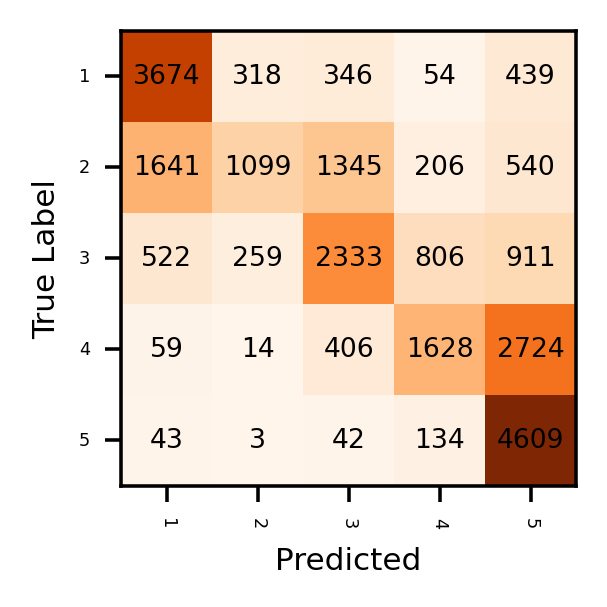

In [ ]:
evaluate_classifier(model, val_iterator, loss_function, recurrent = True)
# train_classifier(model, train_iterator, loss_function, optimizer, logger = logger, num_epochs = num_epochs, print_every = 100, recurrent = True)

# Transfer Learning using Hugging Face 

Transfer learning is a powerful tool to boost the accuracy of a model, especially with limited data. Most transfer learning models for text applications are extremely large and difficult to work with, so to make this easier most use a github repository called [Hugging Face](https://github.com/huggingface) . Getting the data to be in the right format for training can be difficult even with Hugging Face, so for this section we use a library built on top of Hugging Face called [Simple Transformers](https://github.com/ThilinaRajapakse/simpletransformers), which makes transfer learning extremely easy.


## Setting up Simple Transformers

First we download the pip package for SimpleTransformers

In [ ]:
!pip install simpletransformers

     |████████████████████████████████| 153kB 8.6MB/s 
     |████████████████████████████████| 204kB 56.6MB/s 
     |████████████████████████████████| 573kB 60.5MB/s 
     |████████████████████████████████| 3.8MB 47.5MB/s 
     |████████████████████████████████| 1.0MB 56.0MB/s 
     |████████████████████████████████| 870kB 53.8MB/s 
  Created wheel for seqeval: filename=seqeval-0.0.12-cp36-none-any.whl size=7424 sha256=b4d37a35bc62af4ed9c6eefab94ed893484c01fc5a169f356da0a2b2a56c5e54
  Stored in directory: /root/.cache/pip/wheels/4f/32/0a/df3b340a82583566975377d65e724895b3fad101a3fb729f68
  Created wheel for sacremoses: filename=sacremoses-0.0.38-cp36-none-any.whl size=884628 sha256=a572db23dd593956ad434f296768d6d892fd9226d42bf30f6d246b26b78667c2
  Stored in directory: /root/.cache/pip/wheels/6d/ec/1a/21b8912e35e02741306f35f66c785f3afe94de754a0eaf1422
Successfully built seqeval sacremoses
ERROR: transformers 2.8.0 has requirement tokenizers==0.5.2, but you'll have tokenizers 0.6.0 which

In [ ]:
from simpletransformers.classification import ClassificationModel
model_brt = ClassificationModel('bert', 'bert-base-cased', num_labels=6, args=({'fp16': False, 'reprocess_input_data': True}))

The input format for SimpleTransformers is to have the text data in a columm called "text" and to have the labels as a column called "labels" so we do that below.

Now that we've downloaded the model, let's train with it. To train with it, we run the following code snippet below. 

We note that this progresses in two stages: In the first stage the model converts our input data into features (similar to when we created our TabularDataset earlier). In the second stage, it actually trains with those input features and labels, and displays the progress. For reference, it took around ~3 hours to run through a single epoch of the dataset.


In [ ]:
import pickle
import pandas
global_path="/content/drive/My Drive/CIS 522 HW4/"
train_csv=global_path+"train.csv"
train_df =pandas.read_csv(train_csv)
train_df_clean = train_df[['Text','Score']].rename(columns={'Text':'text','Score':'labels'})
# train_df_new = train_df_clean[0:int(len(train_df_clean)/3)]

model_brt.train_model(train_df_clean)

# pickle.dump(model_brt, open(brt_path, 'wb'))
# loaded_model = pickle.load(open(brt_path,'rb'))
# Train the model
# model.train_model(train_df_cleaned = train_df["Text","Score"].rename(columns={'Text':'text'}))

# Evaluate the model
# result, model_outputs, wrong_predictions = model.eval_model(test_df_cleaned)

Running loss: 1.613176

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  warnings.warn("To get the last learning rate computed by the scheduler, "


Running loss: 1.171428



NameError: ignored

In [ ]:
brt_path = global_path+"models/brt_model.pt"
pickle.dump(model_brt, open(brt_path, 'wb'))
# loaded_model = pickle.load(open(brt_path,'rb'))

In [ ]:
brt_loaded_model = pickle.load(open(brt_path,'rb'))

In [ ]:
import pickle
import pandas
global_path="/content/drive/My Drive/CIS 522 HW4/"
val_csv=global_path+"val.csv"
val_df =pandas.read_csv(val_csv)
val_df_clean = val_df[['Text','Score']].rename(columns={'Text':'text','Score':'labels'})


# result, model_outputs, wrong_predictions = model_rbrt.eval_model(val_df_clean)
pred, _ = brt_loaded_model.predict(val_df_clean['text'])


In [ ]:
from sklearn.metrics import f1_score
f1_score(np.asarray(val_df_clean['labels']), pred, average='macro')

0.6031639124621412

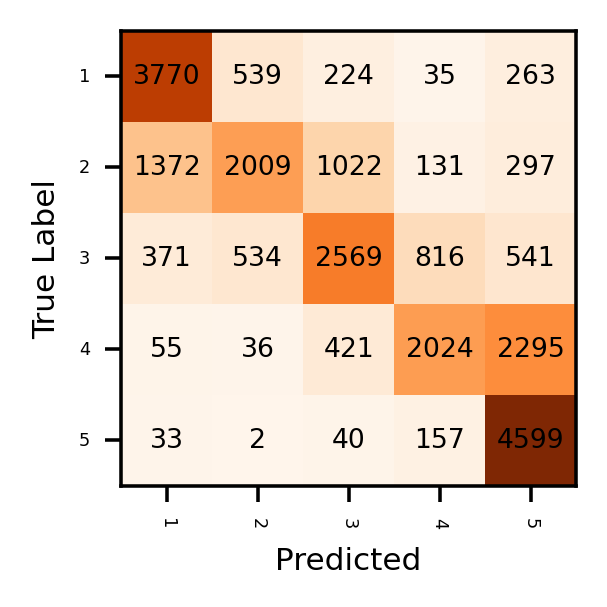

In [ ]:
labels = [1,2,3,4,5]
display_labels = ["1", "2", "3", "4", "5"]
plot_confusion_matrix(np.asarray(val_df_clean['labels']),  pred, labels, display_labels, title='Confusion matrix 5a roberta')

The models learned by transfer learning perform way better than all the previous models (both attention and non attention) because we are able to achieve a higher F1 Score even after running for just one epoch of these transfer learning models, whereas the previous models were run for 5-6 epochs. 

Also, the two transfer learning based (Roberta and Bert) models performed very similar in terms of accuracy with very minor differences. Both the models were able to achieve a high F1 Score and also, very similar confusion matrices. 
However, the Roberta model was able to perform a little better than the Bert model on the testing dataset. (greater F1 Score).


# Seq2Seq model 

In this section, we implement a Seq2Seq architecture to generate the summary for the Review text. The dataset contains one more attribute which is the summary of the review text (it is actually the title reviewers gave while writing the review and the review text is the description provided).

We implement the standard *Encoder-Decoder* model where the review text is given as input to the encoder and the decoder will generate the summary. For simplicity of this project, we implement a basic version of the encoder-decoder architecture and use standard training techniques. More sophisticated versions of the architeture like encoder-decoder attention, teacher-forcing (while training), beam search (for inference), etc. might help the model perform better. 



## Featuring the dataset using torchtext (for the generative task)

For the text generation task, we redefine the torchtext data field and create one torchtext field. Note that, we now need to add start and end tokens to both the text sequences. We use `init_token` and `eos_token` parameters when creating the data field.

We then create a tabular dataset for the training and validation set. This time also load the *Summary* field. Note that to ensure we create a single common vocabulary for both - the text and summary, we use the same data field for both the attributes.

Now we build the vocabulary for the the data field we created using both the training and validation datasets created in the previous step. As before we continue using the glove.6B.300d word embeddings.


In [ ]:

train_df2 = train_df[["Text", "Summary"]]
train_df2.columns

train_df2.to_csv("/content/drive/My Drive/CIS 522 HW4/train_q6.csv")


In [ ]:
val_df2 = val_df[["Text","Summary"]]
val_df2.columns

val_df2.to_csv("/content/drive/My Drive/CIS 522 HW4/val_q6.csv")

In [ ]:

import torch
from torchtext import data

TEXT = data.Field(sequential = True, tokenize = 'spacy', lower = True, include_lengths = True, init_token = "####",eos_token = "@@@@" )



In [ ]:

datafields = [(" ", None),
              ("Text", TEXT),
              ("Summary", TEXT)]

training_data=data.TabularDataset(path = "/content/drive/My Drive/CIS 522 HW4/train_q6.csv",\
                                  format = 'csv',\
                                  fields = datafields,\
                                  skip_header = True)

testing_data = data.TabularDataset(path = "/content/drive/My Drive/CIS 522 HW4/val_q6.csv",\
                                   format = 'csv',\
                                   fields = datafields,\
                                   skip_header = True)

In [ ]:
repo_data = data.TabularDataset(path = repo_path,\
                                   format = 'csv',\
                                   fields = datafields,\
                                   skip_header = True)

In [ ]:
count = 0
for example in training_data:
  count += 1
  print("\n")
  print("Review: ", example.Text)
  print("Summary: ", example.Summary)

  if count == 5:
    break



Review:  ['these', 'remind', 'of', 'a', 'product', 'called', 'munchos', 'that', 'i', 'liked', 'a', 'long', 'time', 'ago', 'in', 'regards', 'to', 'flavor', '.', 'great', 'crunch', 'and', 'salt', 'level', '.', 'i', 'wish', 'they', 'packages', 'a', 'bit', 'bigger', 'than', 'the', '0.8', 'and', 'smaller', 'than', '3', 'oz', '.', ' ', 'the', '0.8', 'is', 'nt', 'quite', 'enough', 'and', 'the', '3', 'is', 'too', 'much', '.', 'about', '1.5', 'oz', 'would', 'be', 'right', 'for', 'my', 'appetite', '.']
Summary:  ['tastes', 'great', '!']


Review:  ['i', 'would', "n't", 'describe', 'these', 'as', 'the', 'best', 'dried', 'cherries', 'i', 'have', 'ever', 'eaten', 'but', 'they', 'were', 'pretty', 'good.<br', '/><br', '/>traverse', 'uses', 'oil', 'with', 'the', 'cherries', 'to', 'prevent', 'caking', ',', 'a', 'little', 'to', 'much', 'in', 'my', 'opinion', '.', ' ', 'these', 'cherries', 'unlike', 'the', 'blueberries', 'i', 'bought', 'from', 'them', 'were', 'not', 'as', 'effected', 'taste', 'wise', '

In [ ]:
datafields_repo = [(" ", None),
              ("Summary", None),
              ("Text", TEXT)]

In [ ]:
repo_data = data.TabularDataset(path = repo_path,\
                                   format = 'csv',\
                                   fields = datafields_repo,\
                                   skip_header = True)

In [ ]:
count = 0
for example in repo_data:
  count += 1
  print("\n", count)
  print("Review: ", example.Text)
  if count == 5:
    break


 1
Review:  ['when', 'you', 'have', 'to', 'eat', 'sugar', '-', 'free', 'foods', 'for', 'health', 'reasons', 'you', 'feel', 'deprived', 'sometimes', 'but', 'i', 'certainly', 'did', 'nt', 'after', 'eating', 'these', '.', ' ', 'they', 'taste', 'exactly', 'like', 'oreos', 'should', '.', ' ', 'they', 'really', 'are', 'a', 'blessing', '.', ' ', 'you', 'could', 'eat', 'the', 'whole', 'box', 'but', 'they', 'have', 'a', 'chemical', 'in', 'them', 'called', 'maltitol', 'that', 'if', 'you', 'eat', 'too', 'many', 'you', 'might', 'have', 'to', 'use', 'the', 'bathroom', 'in', 'a', 'hurry', '.', ' ', 'which', 'is', 'good', 'because', 'it', 'actually', 'prevents', 'you', 'from', 'eating', 'the', 'whole', 'box.<br', '/><br', '/>i', 'love', 'sugar', '-', 'free', 'oreos', '!', '!', '!']

 2
Review:  ['this', 'coffee', 'is', 'very', 'smooth', 'and', 'has', 'a', 'great', 'flavor', ',', 'medium', 'roast', ',', 'without', 'being', 'bitter.<br', '/><br', '/>the', 'pods', 'do', 'not', 'fit', 'in', 'a', 'keurig

In [ ]:

TEXT.build_vocab(training_data, testing_data, min_freq = 3, vectors="glove.6B.300d")

.vector_cache/glove.6B.zip: 862MB [06:32, 2.20MB/s]                          
100%|█████████▉| 399193/400000 [00:36<00:00, 11095.14it/s]

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:

BATCHSIZE = 64

train_iterator = data.BucketIterator(
    training_data,
    batch_size = BATCHSIZE,
    sort_key = lambda x: len(x.Text),
    sort_within_batch = True,
    repeat = False,
    shuffle = True,
    device = device
)

val_iterator = data.BucketIterator(
    testing_data,
    batch_size = 1,
    sort = False,
    sort_key = lambda x: len(x.Text),
    sort_within_batch = False,
    repeat = False,
    shuffle = False,
    device = device
)

print("Done")

Done


In [ ]:
count = 0
for batch in (val_iterator):
  count += 1
  text, text_length = batch.Text
  print(text)
  print(text_length)
  if count == 1:
    break


tensor([[   2],
        [ 294],
        [1250],
        [  27],
        [  48],
        [ 234],
        [  16],
        [  15],
        [  46],
        [  28],
        [ 177],
        [   0],
        [  16],
        [   9],
        [ 366],
        [ 877],
        [   4],
        [ 146],
        [   3]], device='cuda:0')
tensor([19], device='cuda:0')


##  The Encoder Model 

We start by defining the encoder model. This model is exactly the same as the one implemented in previous sections. The encoder's input is the review text and returns an encoded representation of the text (which will be the output of the recurrent layer).


In [ ]:

import torch.nn as nn
import torch.nn.functional as F

class Encoder(nn.Module):
    def __init__(self, mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = None):
      super(Encoder, self).__init__()

      self.output_size = output_size
      self.hidden_size = hidden_size
      self.vocab_size = vocab_size
      self.embedding_length = embedding_length
      self.word_embeddings = word_embeddings
      self.mode = mode
      self.bilstm_mode = bilstm_mode
      #embedding layers
      self.embeddings = nn.Embedding(self.vocab_size, self.embedding_length)
      self.embeddings.weight = nn.Parameter(word_embeddings, requires_grad = False)

      if mode not in ['lstm', 'rnn', 'gru', 'bilstm']:
        raise ValueError("Choose a mode from - rnn / lstm / gru / bilstm")s
      #Recurrent layer
      if mode == 'lstm':
        self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'rnn':
        self.recurrent = nn.RNN(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'gru':
        self.recurrent = nn.GRU(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'bilstm':
        self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = True)

    def forward(self, text, text_lengths):
      # print("text: ",text.shape)
      embedded_text = self.embeddings(text)
      # print("embedded text: ", embedded_text.shape)

      packed_text = nn.utils.rnn.pack_padded_sequence(embedded_text, text_lengths)

      # print(packed_text.shape)

      if (self.mode == 'lstm'):
        _, (hidden_text, _) = self.recurrent(packed_text)
      elif (self.mode == "rnn" or self.mode == "gru"):
        (_, hidden_text) = self.recurrent(packed_text)
      elif (self.mode == "bilstm"):
        _, (hidden_text_con, _) = self.recurrent(packed_text)
        hidden_text1 = hidden_text_con[0]
        hidden_text2 = hidden_text_con[1]

      if (self.bilstm_mode == "add"):
        hidden_text = hidden_text1 + hidden_text2

      if (self.bilstm_mode == "con"):        
        hidden_text = torch.cat((hidden_text1, hidden_text2), dim=1)
        fc_input3 = hidden_text.squeeze(0)
        fc_input = self.fc3(fc_input3)

      return hidden_text

##  The Decoder Model 

We define the `decoder` model. It is the same as the `encoder` model with the only difference being there is an additional fully-connected layer after the output from each token in the sequence. This FC layer will have an output size equal to the vocabulary size.



In [ ]:

import torch.nn as nn
import torch.nn.functional as F

class Decoder(nn.Module):
    def __init__(self, mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = None):
      super(Decoder, self).__init__()
      self.output_size = output_size
      self.hidden_size = hidden_size
      self.vocab_size = vocab_size
      self.embedding_length = embedding_length
      self.word_embeddings = word_embeddings
      self.mode = mode
      self.bilstm_mode = bilstm_mode
      #embedding layers
      self.embeddings = nn.Embedding(self.vocab_size, self.embedding_length)
      self.embeddings.weight = nn.Parameter(word_embeddings, requires_grad = False)
      if mode not in ['lstm', 'rnn', 'gru', 'bilstm']:
        raise ValueError("Choose a mode from - rnn / lstm / gru / bilstm")
      #Recurrent layer
      if mode == 'lstm':
        self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'rnn':
        self.recurrent = nn.RNN(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'gru':
        self.recurrent = nn.GRU(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                num_layers = 1, batch_first = False, dropout = 0, bidirectional = False)
      elif mode == 'bilstm':
        self.recurrent = nn.LSTM(input_size = self.embedding_length, hidden_size = self.hidden_size,\
                                 num_layers = 1, batch_first = False, dropout = 0, bidirectional = True)
        
      #Fully-connected Layer
      # self.fc3 = nn.Linear(2*self.hidden_size, self.hidden_size)
      self.fc1 = nn.Linear(self.hidden_size, self.vocab_size)
      # self.fc2 = nn.Linear(int(self.hidden_size/2), self.output_size)

    def forward(self, current_token, hidden_text):
      # print("text: ",text.shape)
      embedded_text = self.embeddings(current_token)
      # print("embedded text: ", embedded_text.shape)

      if (self.mode == 'lstm'):
        _, (hidden_text, _) = self.recurrent(embedded_text.unsqueeze(0), hidden_text)
      elif (self.mode == "rnn" or self.mode == "gru"):
        (_, hidden_text) = self.recurrent(embedded_text.unsqueeze(0), hidden_text)
      elif (self.mode == "bilstm"):
        _, (hidden_text_con, _) = self.recurrent(packed_text)
        hidden_text1 = hidden_text_con[0]
        hidden_text2 = hidden_text_con[1]
          
      # # print("hidden text: ", hidden_text_con.shape)

      if (self.bilstm_mode == "add"):
        hidden_text = hidden_text1 + hidden_text2

      if (self.bilstm_mode == "con"):       
        hidden_text = torch.cat((hidden_text1, hidden_text2), dim=1)
        fc_input3 = hidden_text.squeeze(0)
        fc_input = self.fc3(fc_input3)

      if (self.bilstm_mode != "con"):
        fc_input = hidden_text.squeeze(0)
        # print("fc_input", fc_input.shape)

      temp = (self.fc1(fc_input))

      return temp, hidden_text

## The Encoder-Decoder Model

Now, we define the encoder-decoder model which represents the overall architecture end-to-end. 

The encoder-decoder architeture behaves as follows,


*   Passes the review text as input through the encoder.
*   Initializes the hidden state of the decoder with the last hidden state output from the encoder.
*   The decoder will take the `<start>` token as the input in the first timestep and produce an output one timestep at a time. This means our decoder is passed only one token at a time and outputs a single token. The output from the previous timestep will be fed as input in the current timestep.
*   Returns the output from the decoder concatenated at each timestep.

While training, the decoder will generate outputs till the maximum summary length for that batch. This means, we call the decoder in a for loop which runs till the length of the decoder output sequence is equal to the maximum length of the summary (true label) for that batch.

During evaluation, the decoder produces an output till the decoder outputs the `<end>` token. The batch size is taken to be 1 during evaluation.



In [ ]:

class Seq2Seq(nn.Module):
  def __init__(self, mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, pad_idx = 1, bilstm_mode = None):
      super(Seq2Seq, self).__init__()
      self.output_size = output_size
      self.hidden_size = hidden_size
      self.vocab_size = vocab_size
      self.embedding_length = embedding_length
      self.word_embeddings = word_embeddings
      self.mode = mode
      self.bilstm_mode = bilstm_mode
      #embedding layers
      self.embeddings = nn.Embedding(self.vocab_size, self.embedding_length)
      self.embeddings.weight = nn.Parameter(word_embeddings, requires_grad = False)
      #encoder network
      self.encoder = Encoder(mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = None)
      #decoder network
      self.decoder = Decoder(mode, output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode = None)
      #initialize loss and optimizer
      self.criterion = nn.CrossEntropyLoss(ignore_index = pad_idx) #ignore_index = pad_idx
      self.encoder_optimizer = torch.optim.Adam(self.encoder.parameters(), lr=1e-4)
      self.decoder_optimizer = torch.optim.Adam(self.decoder.parameters(), lr=1e-4)
      self.encoder_optimizer.zero_grad()
      self.decoder_optimizer.zero_grad()

  def forward(self, text, text_lengths, output_tokens, training_mode = True):

    final_output = []
    loss = 0
    max_seq_length = len(output_tokens) #output_tokens.shape = (max_seq_length, 64)
    hidden_text = self.encoder(text, text_lengths) # (1,64,256)
    decoder_input = output_tokens[0]  # (64)
    for i in range(1, max_seq_length):
      decoder_output, hidden_text = self.decoder(decoder_input, hidden_text) #shapes = (64, 67339), (1,64,256)
      topv, topi = decoder_output.topk(1) #topv.shape = topi.shape = (64,1)
      decoder_input = topi.squeeze().detach()  # (64)
      final_output.append(decoder_input)
     
      loss += self.criterion(decoder_output, output_tokens[i])
    loss.backward()
    if training_mode == True:
      self.encoder_optimizer.step()
      self.decoder_optimizer.step()


    return loss.item()/max_seq_length

## Train Seq2Seq



In [ ]:
print("freqs: ",TEXT.vocab.freqs)


freqs:  Counter({'.': 1670994, 'the': 1309000, ',': 1235889, 'i': 1135377, 'and': 898744, 'a': 856610, 'it': 745052, 'to': 709153, ' ': 681112, 'of': 564821, 'is': 527061, 'this': 469760, 'for': 401781, '!': 389508, 'in': 382286, 'my': 330649, 'that': 314626, 'but': 275782, 'not': 263535, 'you': 256714, 'with': 247267, 'have': 245886, 'was': 232688, 'are': 227835, '-': 218580, 'they': 214640, "'s": 214433, "n't": 212763, 'as': 196171, 'on': 190740, 'like': 185317, '/><br': 177371, 'so': 176501, 'good': 169980, 'these': 164191, 'great': 158255, '"': 155385, 'them': 145591, '(': 134045, 'be': 133562, 'taste': 129847, 'coffee': 129795, 'product': 126646, 'at': 126241, 'very': 125204, 'or': 124448, 'do': 123225, 'just': 122829, 'one': 122511, ')': 121946, 'if': 114856, 'all': 110661, 'flavor': 108908, 'tea': 106608, 'love': 103445, 'from': 103073, 'can': 101702, 'we': 96457, 'would': 95437, 'more': 95304, 'food': 94903, 'when': 92528, 'has': 92161, 'me': 91181, 'had': 90142, 'will': 88227,

In [ ]:
print("itos: ",TEXT.vocab.itos)


itos:  ['<unk>', '<pad>', '####', '@@@@', '.', 'the', ',', 'i', 'and', 'a', 'it', 'to', ' ', 'of', 'is', 'this', 'for', '!', 'in', 'my', 'that', 'but', 'not', 'you', 'with', 'have', 'was', 'are', '-', 'they', "'s", "n't", 'as', 'on', 'like', '/><br', 'so', 'good', 'these', 'great', '"', 'them', '(', 'be', 'taste', 'coffee', 'product', 'at', 'very', 'or', 'do', 'just', 'one', ')', 'if', 'all', 'flavor', 'tea', 'love', 'from', 'can', 'we', 'would', 'more', 'food', 'when', 'has', 'me', 'had', 'will', 'than', 'out', 'no', 'get', 'other', 'best', 'really', 'up', 'some', 'about', '/', '...', 'only', 'too', 'much', 'an', 'your', 'there', 'what', 'little', 'were', 'because', 'use', 'price', 'time', 'amazon', 'also', "'ve", 'did', 'dog', 'buy', 'which', 'does', 'been', 'she', 'better', 'by', 'tried', 'he', 'even', 'am', 'find', 'make', 'well', 'after', "'m", 'eat', 'try', '<', 'any', 'now', 'cup', 'chocolate', 'water', 'first', 'their', 'sugar', 'could', '?', 'our', 'sweet', 'her', 'bag', 'deli

In [ ]:
print("stoi: ", TEXT.vocab.stoi)


stoi:  defaultdict(<function _default_unk_index at 0x7f58ace12158>, {'<unk>': 0, '<pad>': 1, '####': 2, '@@@@': 3, '.': 4, 'the': 5, ',': 6, 'i': 7, 'and': 8, 'a': 9, 'it': 10, 'to': 11, ' ': 12, 'of': 13, 'is': 14, 'this': 15, 'for': 16, '!': 17, 'in': 18, 'my': 19, 'that': 20, 'but': 21, 'not': 22, 'you': 23, 'with': 24, 'have': 25, 'was': 26, 'are': 27, '-': 28, 'they': 29, "'s": 30, "n't": 31, 'as': 32, 'on': 33, 'like': 34, '/><br': 35, 'so': 36, 'good': 37, 'these': 38, 'great': 39, '"': 40, 'them': 41, '(': 42, 'be': 43, 'taste': 44, 'coffee': 45, 'product': 46, 'at': 47, 'very': 48, 'or': 49, 'do': 50, 'just': 51, 'one': 52, ')': 53, 'if': 54, 'all': 55, 'flavor': 56, 'tea': 57, 'love': 58, 'from': 59, 'can': 60, 'we': 61, 'would': 62, 'more': 63, 'food': 64, 'when': 65, 'has': 66, 'me': 67, 'had': 68, 'will': 69, 'than': 70, 'out': 71, 'no': 72, 'get': 73, 'other': 74, 'best': 75, 'really': 76, 'up': 77, 'some': 78, 'about': 79, '/': 80, '...': 81, 'only': 82, 'too': 83, 'much

In [ ]:
print("vectors: ", TEXT.vocab.vectors)

In [ ]:
print(len(TEXT.vocab))

67339


In [ ]:
pad_idx = TEXT.vocab.stoi['<pad>']
sos_idx = TEXT.vocab.stoi['####']
eos_idx = TEXT.vocab.stoi["@@@@"]

print(pad_idx, sos_idx, eos_idx)

1 2 3


In [ ]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

# Load the TensorBoard notebook extension
%load_ext tensorboard

from torch.utils.tensorboard import SummaryWriter

ROOT_LOG_DIR = "/content/drive/My Drive/CIS 522 HW4/Logs"
TENSORBOARD_DIR = "Q6_train" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:
%tensorboard --logdir {ROOT_LOG_DIR.replace(" ", "\\ ")}

<IPython.core.display.Javascript object>

In [ ]:

output_size = 5
hidden_size = 256
vocab_size = len(TEXT.vocab)
embedding_length = 300
word_embeddings = TEXT.vocab.vectors
num_epochs = 5
mode_list = ['lstm', 'rnn', 'gru', 'bilstm']

seq2seq_model = Seq2Seq(mode_list[2], output_size, hidden_size, vocab_size, embedding_length, word_embeddings, bilstm_mode="con") 
seq2seq_model = seq2seq_model.to(device)
loss_vals = []
count_vals = []
count = 0
for epoch in range(num_epochs):
  step = 0
  print("epoch: ", epoch + 1)
  for batch in train_iterator:

      text, text_lengths = batch.Text
      summary, summary_lengths = batch.Summary

      loss = seq2seq_model(text, text_lengths, summary)
      if (step%100 == 0):
        print("step: ", step, "loss: ", loss)
        logger.add_scalar("Loss seq2seq/train", loss, count)
        loss_vals.append(loss)
        count_vals.append(loss)


      step += 1
      count += 1

epoch:  1
step:  0 loss:  10.52958839818051
step:  100 loss:  3.1179242451985676
step:  200 loss:  3.2819149310772238
step:  300 loss:  2.3065943400065105
step:  400 loss:  2.4110536575317383
step:  500 loss:  2.771348317464193
step:  600 loss:  2.300067138671875
step:  700 loss:  2.7373379601372614
step:  800 loss:  3.6000739203559027
step:  900 loss:  2.0219263349260603
step:  1000 loss:  2.998987499036287
step:  1100 loss:  3.3273213704427085
step:  1200 loss:  3.321354457310268
step:  1300 loss:  3.632823341771176
step:  1400 loss:  3.233304023742676
step:  1500 loss:  2.759319598858173
step:  1600 loss:  3.2165567609998913
step:  1700 loss:  2.065625031789144
step:  1800 loss:  2.720831553141276
step:  1900 loss:  2.809910888671875
step:  2000 loss:  2.94405034383138
step:  2100 loss:  3.023107147216797
step:  2200 loss:  3.7031389124253216
step:  2300 loss:  3.900235070122613
step:  2400 loss:  3.4146766662597656
step:  2500 loss:  3.401904386632583
step:  2600 loss:  2.510093688

KeyboardInterrupt: ignored